**IMPORTANT: To reduce the file size and ensure GitHub can open the file, several model quality control outputs (trace plots) have been excluded from this GitHub version. To view these outputs, download the file and run it manually.**

In this part of the project I'll work on linear models (and generalized linear models) .

In [1]:
import arviz as az
import pymc as pm
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.special import logsumexp
from graphviz import Digraph
az.style.use("arviz-darkgrid")

In [2]:
def standardize(series):
    """Standardize a pandas series"""
    std_series = (series - series.mean()) / series.std()
    return std_series

In [11]:
df = pd.read_csv("bart_data_lm.csv")
df

,participant,condition,p_burst,trial,pumps,cash,total,session,block,explosion
0,0,drunk,15,1,12,0.00,0.00,1,1,True
1,0,drunk,15,2,1,0.00,0.00,1,1,True
2,0,drunk,15,3,4,0.00,0.00,1,1,True
3,0,drunk,15,4,4,0.81,0.81,1,1,False
4,0,drunk,15,5,4,0.00,0.81,1,1,True
...,...,...,...,...,...,...,...,...,...,...
4855,17,tipsy,20,26,3,0.79,12.20,3,3,False
4856,17,tipsy,20,27,1,0.00,12.20,3,3,True
4857,17,tipsy,20,28,2,0.63,12.83,3,3,False
4858,17,tipsy,20,29,2,0.63,13.46,3,3,False


# PART A - LINEAR MODELS

In [12]:
df = pd.read_csv("bart_data_lm.csv")
df.head()

,participant,condition,p_burst,trial,pumps,cash,total,session,block,explosion
0,0,drunk,15,1,12,0.00,0.00,1,1,True
1,0,drunk,15,2,1,0.00,0.00,1,1,True
2,0,drunk,15,3,4,0.00,0.00,1,1,True
3,0,drunk,15,4,4,0.81,0.81,1,1,False
4,0,drunk,15,5,4,0.00,0.81,1,1,True


In [13]:
grouped_df = df.groupby(['participant', 'condition', 'session', 'block', 'p_burst'])

def find_TR(x): return x.iloc[-1]
aggregation_dict = {
    'total': find_TR, # TR
    'pumps': 'sum', # pE = explosion_sum / pumps_sum
    'explosion':'sum', # pE = explosion_sum / pumps_sum
}

df2_sums = grouped_df.agg(aggregation_dict).reset_index()
df2_sums = df2_sums.rename(columns={'total': 'TR', 'pumps': 'pumps_sum', 'explosion': 'explosion_sum'})


aggregation_dict = {
    'pumps': 'mean', # NOP
    'explosion':'mean', # 1 - pC
}
df2_means = grouped_df.agg(aggregation_dict).reset_index()
df2_means = df2_means.rename(columns={'pumps': 'NOP', 'explosion': 'explosion_mean'})

df2 = pd.concat([df2_sums, df2_means[['NOP', 'explosion_mean']]], axis=1)

df2['NOP_s'] = standardize(df2['NOP'])
df2['pC'] = 1 - df2['explosion_mean']
df2['pC_s'] = standardize(1 - df2['explosion_mean'])
df2['pE'] = df2['explosion_sum']/df2['pumps_sum']
df2['TR_s'] = standardize(df2['TR'])
df2['C'] = 30 - df2['explosion_sum']
df2['PB_s'] = standardize(df2['p_burst'])

df2 = df2[['participant', 'condition', 'p_burst', 'TR', 'pumps_sum', 'explosion_sum', 'NOP', 'explosion_mean', 'session', 'block', 'pC', 'pE', 'NOP_s', 'TR_s', 'PB_s', 'pC_s', 'C']]
df2

,participant,condition,p_burst,TR,pumps_sum,explosion_sum,NOP,explosion_mean,session,block,pC,pE,NOP_s,TR_s,PB_s,pC_s,C
0,0,drunk,15,13.70,138,17,4.600000,0.566667,1,1,0.433333,0.123188,0.440533,-0.509520,0.000000,-0.663809,13
1,0,drunk,20,17.33,151,23,5.033333,0.766667,1,2,0.233333,0.152318,0.745718,0.534699,1.220959,-1.909411,7
2,0,drunk,10,12.83,226,19,7.533333,0.633333,1,3,0.366667,0.084071,2.506399,-0.759787,-1.220959,-1.079009,11
3,0,sober,15,13.05,150,22,5.000000,0.733333,3,1,0.266667,0.146667,0.722242,-0.696501,0.000000,-1.701811,8
4,0,sober,10,17.29,261,19,8.700000,0.633333,3,2,0.366667,0.072797,3.328051,0.523193,-1.220959,-1.079009,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,17,sober,10,13.29,101,12,3.366667,0.400000,2,2,0.600000,0.118812,-0.428070,-0.627462,-1.220959,0.374193,18
158,17,sober,15,15.81,97,11,3.233333,0.366667,2,3,0.633333,0.113402,-0.521973,0.097450,0.000000,0.581794,19
159,17,tipsy,10,20.21,175,12,5.833333,0.400000,3,1,0.600000,0.068571,1.309136,1.363170,-1.220959,0.374193,18
160,17,tipsy,15,17.41,110,11,3.666667,0.366667,3,2,0.633333,0.100000,-0.216788,0.557712,0.000000,0.581794,19


Assume the following DAG with variables:
- A: alcohol condition
- S: order of session presentation (i.e. when, for the whole experiment, a session of blocks is given to the participant: is it the first, second, or third session of the experiment)
- B: order of block presentation (i.e. when, within a session, a block of trials is given to the participant: is it the first, second, or third block of the session)
- PB: probability of burst (balloon's burst probability, set experimentally)
- NOP: *mean* number of pumps across trials, within a block
- pC: proportion of cashed trials in a block
- pE: proportion of explosions in a block (with respect to total number of pumps in a block)
- TR: total reward of a block

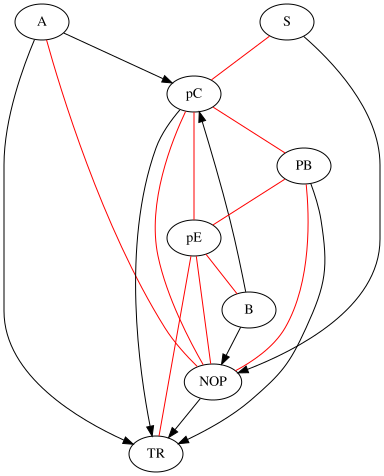

In [14]:
dot = Digraph()

# experimental
dot.node("A", "A") # alcohol condition
dot.node("S", "S") # session
dot.node("B", "B") # block
dot.node("PB", "PB") # probability of burst

# outcomes
dot.node("NOP", "NOP") # mean number of pumps
dot.node("pC", "pC") # proportion cashed
dot.node("pE", "pE") # proportion explode
dot.node("TR", "TR") # total reward

# edges
dot.edge("NOP", "TR")
dot.edge("A", "pC")
dot.edge("A", "TR")
dot.edge("pC", "TR")
dot.edge("S", "NOP")
dot.edge("PB", "TR")
dot.edge("B", "NOP")
dot.edge("B", "pC")

# discuss
dot.edge("pE", "NOP", dir='none', color='red')
dot.edge("PB", "NOP", dir='none', color='red')
dot.edge("NOP", "pC", dir='none', color='red')
dot.edge("pC", "PB", dir='none', color='red')
dot.edge("NOP", "A", dir='none', color='red')
dot.edge("PB", "pE", dir='none', color='red')
dot.edge("pE", "TR", dir='none', color='red')
dot.edge("pE", "pC", dir='none', color='red')
dot.edge("pE", "B", dir='none', color='red')
dot.edge("S", "pC", dir='none', color='red')

dot

Part 1:

**pE and B**: I take B -> pE, expecting the order of blocks to have some effect on the proportion of explosions in a block.

**S and pC**: I take S -> pC because it makes sense for a participant to get some experience in each session which would have a causal effect on the participants' actions in later sessions and it might influence the proportion of cashed trials.

**pC and PB**: I take PB -> pC, assuming the prior knowledge of each participant affects how they act within the trial, thus affecting the cashed trials proportion.

**NOP and A**: I take A -> NOP. It seems probable for the condition of each participant to effect the (mean) number of pumps per trial, within a block.

**PB and pE**: I take PB -> pE. Clearly, we can excpect there is a high chance that each participant acts differently in each block, depending on their prior knowledge of p_burst, thus resulting in an effect in pE.

**PB and NOP**: I take PB -> NOP, assuming that the number of pumps across different trials of each participant is effectd by their prior knowledge of p_burst.

**pE and NOP**: I take no causal relationship between them. Although pE and NOP might have some connections which could be useful in predictions, but I don't any causal relation between them where one of them might cause another. Because although as NOP gets larger, explosion_mean might increase, but the NOP itself is equavalent to pumps_sum devided by total pumps (which results in pumps_mean). So it doesn't seem like good idea to pconsider a causal relation between them. Basically, there is no proper **temporal precedence** here to conclude pE causes NOP or NOP causes pE.

**NOP and pC**: I take NOP -> pC, considring it seems reasonable to expect that as participants pumps more, they might cause more explosions and have less cashed trials.

**pE and TR**: in order to avoid multicolinearity, I take no connection between them. TR already contains direct arrows from NOP, pC, and A. pE contains information about the pumps proportion (very similar to NOP) and explosions proportion (very similar to informtation contained in pC) so adding pE while 2 other connections alreay provide the information might result in multicolinearity.

**pE and pC**: I take no causal effect here as well. For a similar reasoning to the case of pE and NOP. Becuase we can't really say one of pC or pE happens first and causes another.

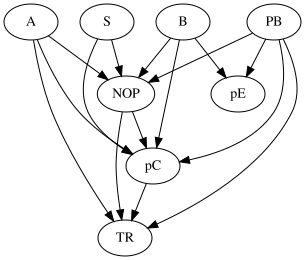

In [15]:
dot = Digraph()

# experimental
dot.node("A", "A") # alcohol condition
dot.node("S", "S") # session
dot.node("B", "B") # block
dot.node("PB", "PB") # probability of burst

# outcomes
dot.node("NOP", "NOP") # mean number of pumps
dot.node("pC", "pC") # proportion cashed
dot.node("pE", "pE") # proportion explode
dot.node("TR", "TR") # total reward

# edges
dot.edge("NOP", "TR")
dot.edge("A", "pC")
dot.edge("A", "TR")
dot.edge("pC", "TR")
dot.edge("S", "NOP")
dot.edge("PB", "TR")
dot.edge("B", "NOP")
dot.edge("B", "pC")

dot.edge("PB", "NOP")
dot.edge("NOP", "pC")
dot.edge("PB", "pC")
dot.edge("A", "NOP")
dot.edge("PB", "pE")
dot.edge( "B", "pE")
dot.edge("S", "pC")

dot

Using the DAG in part 1, for all variable pairs $X \rightarrow Y$ given below, we can now estimate total effects and the direct effect if there's an edge between the two. I will check:
- what's the overall effect?
- for which participant the effect is more profound?
    
- $A \rightarrow NOP$
- $S \rightarrow NOP$
- $B \rightarrow NOP$
- $PB \rightarrow NOP$
- $A \rightarrow pC$
- $B \rightarrow pC$
- $S \rightarrow pC$
- $PB \rightarrow pC$
- $A \rightarrow TR$

### 1.
$A \rightarrow NOP$
and $A \rightarrow pC$

Model 1: 1 model for all participants: This model could be used for estimating the direct and total causal effect of $A \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{A[i]}
\\
  \alpha_{k} &\sim \text{Normal}(1, 1)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 2: data from different participants:This model could be used for estimating the total and direct causal effect for $A \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{A[i], participant[i]}
\\
  \alpha_{k, l} &\sim \text{Normal}(1,1)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 3: 1 model for all participants: This model could be used for estimating the total causal effect for $A \rightarrow pC$ and the

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{A[i]}
\\
  \alpha_{k} &\sim \text{Normal}(0.2, 0.3)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 4: data from different participants:This model could be used for estimating the total causal effect for $A \rightarrow pC$:

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{A[i], participant[i]}
\\
  \alpha_{k, l} &\sim \text{Normal}(0.2, 0.3)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

--> No model could be used in order to find the direct effect of $A \rightarrow pC$: the moment we add NOP to our model, we are also opening multiple fork paths (or collider paths, depending on how we look at it) that come from S, B, and PB, none of which could be closed because there also exists a collider between each them and A.

In [17]:
df2["A"] = pd.Categorical(df2["condition"]).codes

In [ ]:
with pm.Model() as m_A1:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1, shape = 3, dims="A")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['A']]
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A1 = pm.sample()

In [ ]:
az.plot_trace(trace_A1, compact=False)

In [ ]:
az.summary(trace_A1)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],3.958,0.192,3.592,4.311,0.003,0.002,3708.0,1704.0,1.0
alpha[1],3.772,0.193,3.422,4.141,0.004,0.003,2923.0,1629.0,1.0
alpha[2],3.862,0.186,3.524,4.235,0.004,0.003,2642.0,1617.0,1.0
sigma,1.437,0.082,1.282,1.583,0.002,0.001,2514.0,1748.0,1.0


In [ ]:
df2

,participant,condition,p_burst,TR,pumps_sum,explosion_sum,NOP,explosion_mean,session,block,pC,pE,NOP_s,TR_s,PB_s,pC_s,C,A,S,B
0,0,drunk,15,13.70,138,17,4.600000,0.566667,1,1,0.433333,0.123188,0.440533,-0.509520,0.000000,-0.663809,13,0,0,0
1,0,drunk,20,17.33,151,23,5.033333,0.766667,1,2,0.233333,0.152318,0.745718,0.534699,1.220959,-1.909411,7,0,0,1
2,0,drunk,10,12.83,226,19,7.533333,0.633333,1,3,0.366667,0.084071,2.506399,-0.759787,-1.220959,-1.079009,11,0,0,2
3,0,sober,15,13.05,150,22,5.000000,0.733333,3,1,0.266667,0.146667,0.722242,-0.696501,0.000000,-1.701811,8,1,2,0
4,0,sober,10,17.29,261,19,8.700000,0.633333,3,2,0.366667,0.072797,3.328051,0.523193,-1.220959,-1.079009,11,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,17,sober,10,13.29,101,12,3.366667,0.400000,2,2,0.600000,0.118812,-0.428070,-0.627462,-1.220959,0.374193,18,1,1,1
158,17,sober,15,15.81,97,11,3.233333,0.366667,2,3,0.633333,0.113402,-0.521973,0.097450,0.000000,0.581794,19,1,1,2
159,17,tipsy,10,20.21,175,12,5.833333,0.400000,3,1,0.600000,0.068571,1.309136,1.363170,-1.220959,0.374193,18,2,2,0
160,17,tipsy,15,17.41,110,11,3.666667,0.366667,3,2,0.633333,0.100000,-0.216788,0.557712,0.000000,0.581794,19,2,2,1


array([<Axes: title={'center': 'alpha\n0'}>,
       <Axes: title={'center': 'alpha\n1'}>,
       <Axes: title={'center': 'alpha\n2'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

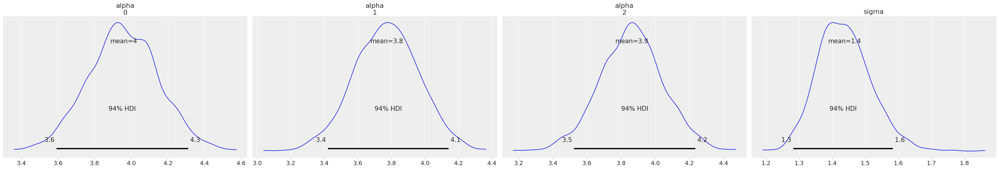

In [ ]:
az.plot_posterior(trace_A1)

**MODEL analysis 1:**

Observe that in every case we have a highly efficient sample size and a r_hat which is very close to 1.0 for pretty much every one of our posteriors. So our model doesn't seem to have any problems. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that the mean, lower HDI, and upper HDI of alpha are getting bigger and bigger we move from alpha[1] to  alpha[2] to alpha[0], which basically shows us that based on our model, we can claim that a as a person gets drunker and drunker, their NOP (the mean number of pumps within trials) increases).

Althugh these 3 HDIs have relatively large area in common. So it could be said that the effect of A on NOP is not that significant.

In [ ]:
with pm.Model() as m_A2:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1, shape = [3, 18], dims=["A", "particpant"])
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['A'], df2['participant']]
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A2 = pm.sample()

In [ ]:
az.plot_trace(trace_A2, compact=False)

In [ ]:
az.summary(trace_A2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha[0, 0]",2.576,0.844,0.994,4.077,0.013,0.011,4064.0,1388.0,1.00
"alpha[0, 1]",1.672,0.874,0.063,3.258,0.016,0.014,3178.0,1256.0,1.01
"alpha[0, 2]",1.666,0.850,0.178,3.302,0.013,0.012,4079.0,1201.0,1.00
"alpha[0, 3]",2.055,0.842,0.361,3.516,0.014,0.011,3675.0,1189.0,1.00
"alpha[0, 4]",1.961,0.814,0.415,3.385,0.012,0.009,4896.0,1435.0,1.00
"alpha[0, 5]",1.630,0.797,0.120,3.094,0.013,0.011,3666.0,1286.0,1.00
"alpha[0, 6]",2.232,0.830,0.742,3.793,0.012,0.010,4571.0,1675.0,1.00
"alpha[0, 7]",2.195,0.815,0.723,3.705,0.015,0.012,2969.0,1393.0,1.00
"alpha[0, 8]",2.262,0.836,0.679,3.793,0.013,0.010,4320.0,1309.0,1.00
"alpha[0, 9]",2.086,0.816,0.508,3.512,0.014,0.011,3608.0,1460.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (55) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'}>],
       [<Axes: title={'center': 'alpha\n0, 12'}>,
        <Axes: title={'center': 'alpha\n0, 13'}>,
        <Axes: title={'center': 'alpha\n0, 14'}>,
        <Axes: title={'center': 'alpha\n0, 15'}>],
       [<Axes: title={'center': 'alpha\n0, 16'}>,
        <Axes: title={'center': 'alpha\n0, 17'}>,
        <Axes: title={'center': 'alpha\n1, 0'}>,
        <Axes: title={'center': 'alpha\n1, 1'}>],
       

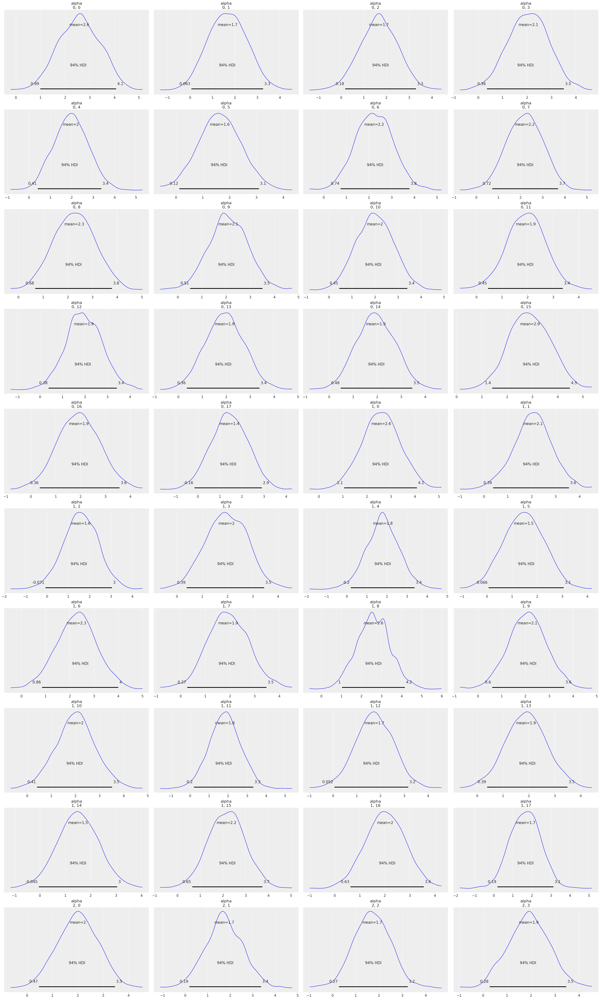

In [ ]:
az.plot_posterior(trace_A2)

**MODEL 2 analysis:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that unlike in model 1, in this model, we can not claim that as a person gets drunker, he/she should also have a larger NOP. Here, this effect is different for each participant. We can observe that, in the sober condition (index 1), the person with the largest number of predicted mean pumps is participant 1 (and we can see that participant 1 has a larger mean HDI when sober, compared to when drunk. Although, this different is very insignificant and negligible.

And for the case of the tipsy and drunk condition, it is participant 16 (index 15) that has bas the largest NOP (around 2.9 mean HDI). This person has a much lower predicted when s/he is sober and has not drunk alcohol. It seems that this person has been the most affected by alcohol among these 18 participants.

In [ ]:
with pm.Model() as m_A3:
    A = pm.MutableData('A', df2["A"])
    alpha = pm.Normal('alpha', mu = 0.2, sigma = 0.3, shape = 3, dims="A")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['A']]
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A3 = pm.sample()

In [ ]:
az.plot_trace(trace_A3, compact=False)

In [ ]:
az.summary(trace_A3)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],0.530,0.022,0.490,0.572,0.0,0.0,3524.0,1642.0,1.0
alpha[1],0.553,0.023,0.509,0.597,0.0,0.0,3938.0,1155.0,1.0
alpha[2],0.533,0.022,0.487,0.572,0.0,0.0,3742.0,1528.0,1.0
sigma,0.162,0.009,0.145,0.179,0.0,0.0,2399.0,1699.0,1.0


array([<Axes: title={'center': 'alpha\n0'}>,
       <Axes: title={'center': 'alpha\n1'}>,
       <Axes: title={'center': 'alpha\n2'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

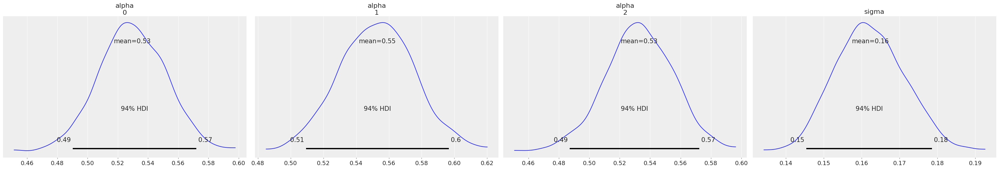

In [ ]:
az.plot_posterior(trace_A3)

**MODEL 3 analysis:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that the 3 HDIs of our alpha values are extremely close to each other and the area in common between them is large (especially for drunk and tipsy conditions). So we can claim based on our model that there doesn't seem that there is that much of an effect on the proportion of cashed trials in different alcohol conditions.

In [ ]:
with pm.Model() as m_A4:
    A = pm.MutableData('A', df2["A"])
    alpha = pm.Normal('alpha', mu = 0.2, sigma = 0.3, shape = [3, 18], dims=["A", "particpant"])
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['A'], df2['participant']]
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A4 = pm.sample()

In [ ]:
az.plot_trace(trace_A4, compact=False)

In [ ]:
az.summary(trace_A4)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha[0, 0]",0.340,0.059,0.230,0.454,0.001,0.001,4005.0,1357.0,1.00
"alpha[0, 1]",0.660,0.057,0.556,0.770,0.001,0.001,3004.0,1311.0,1.00
"alpha[0, 2]",0.659,0.062,0.545,0.773,0.001,0.001,3384.0,1233.0,1.00
"alpha[0, 3]",0.424,0.059,0.313,0.535,0.001,0.001,2759.0,1490.0,1.00
"alpha[0, 4]",0.596,0.056,0.493,0.702,0.001,0.001,3385.0,1328.0,1.00
"alpha[0, 5]",0.712,0.058,0.603,0.818,0.001,0.001,3461.0,1547.0,1.00
"alpha[0, 6]",0.477,0.059,0.368,0.589,0.001,0.001,2760.0,1391.0,1.00
"alpha[0, 7]",0.329,0.058,0.221,0.436,0.001,0.001,3410.0,1494.0,1.00
"alpha[0, 8]",0.499,0.059,0.391,0.611,0.001,0.001,2967.0,1351.0,1.00
"alpha[0, 9]",0.457,0.059,0.340,0.564,0.001,0.001,3668.0,1408.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (55) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'}>],
       [<Axes: title={'center': 'alpha\n0, 12'}>,
        <Axes: title={'center': 'alpha\n0, 13'}>,
        <Axes: title={'center': 'alpha\n0, 14'}>,
        <Axes: title={'center': 'alpha\n0, 15'}>],
       [<Axes: title={'center': 'alpha\n0, 16'}>,
        <Axes: title={'center': 'alpha\n0, 17'}>,
        <Axes: title={'center': 'alpha\n1, 0'}>,
        <Axes: title={'center': 'alpha\n1, 1'}>],
       

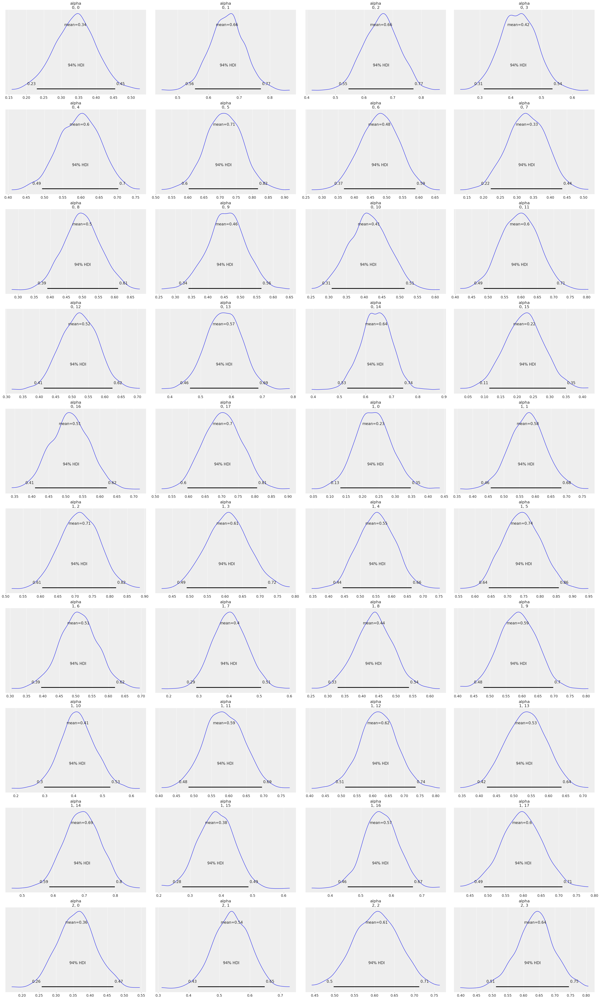

In [ ]:
az.plot_posterior(trace_A4)

**MODEL 4 analysis:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that the result here is the complete opposite of model 3. For many participants, it could be seen here that the HDIs show different variations of changes in pC for different alcohol conditions. For example, participant 16 index 15) who showed a strong effect of alcohol in model 2, also shows similar actions in this model. It could be seen that Participant 16 has a relatively high proportion of predicted HDI mean for their cashed trials when sober, but their amount of cashed trials has a darastic decrease when tipsy and drunk.

It could also be observed that participant 6 (index 5) is the person with the highest mean HDI of cashed trials proportion when drunk and sober (with predicted values ~0.7) and s/he also has the 2nd highest predicted mean for when tipsy, with participant 18 being the one with the best predicted pC mean when tipsy.

It is also surprising that many of the participants seem to have their worst results when tipsy, not when drunk.

Although, it is worth mentioning that in general, many of these HDIs have big areas of intersection. So, althugh we can do some analysis by comparing their mean HDIs, we can still not have a big confidence in many of our cases. In fact some of the above results might change a bit if we run the model anther time.

### 2.
$S \rightarrow NOP$
and $S \rightarrow pC$

Model 5: 1 model for all participants: This model could be used for estimating the direct and total causal effect of $S \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{S[i]}
\\
  \alpha_{k} &\sim \text{Normal}(1,1)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 6: data from different participants:This model could be used for estimating the total and direct causal effect for $S \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{S[i], participant[i]}
\\
  \alpha_{k, l} &\sim \text{Normal}(1,1)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 7: 1 model for all participants: This model could be used for estimating the total causal effect for $S \rightarrow pC$ and the

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{S[i]}
\\
  \alpha_{k} &\sim \text{Normal}(0.2, 0.3)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 8: data from different participants:This model could be used for estimating the total causal effect for $S \rightarrow pC$:

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{S[i], participant[i]}
\\
  \alpha_{k, l} &\sim \text{Normal}(0.2, 0.3)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

--> No model could be used in order to find the direct effect of $S \rightarrow pC$: the moment we add NOP to our model, we are also opening multiple fork paths (or collider paths, depending on how we look at it) that come from A, B, and PB, none of which could be closed because there also exists a collider between each them and S.

In [18]:
df2['S'] = df2['session'] - 1

In [ ]:
with pm.Model() as m_A5:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1, shape = 3, dims="S")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['S']]
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A5 = pm.sample()

In [ ]:
az.plot_trace(trace_A5, compact=False)

In [ ]:
az.summary(trace_A5)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],3.813,0.195,3.445,4.165,0.004,0.003,2639.0,1356.0,1.0
alpha[1],3.804,0.200,3.423,4.158,0.003,0.002,3655.0,1667.0,1.0
alpha[2],3.979,0.190,3.625,4.325,0.003,0.002,3443.0,1643.0,1.0
sigma,1.437,0.083,1.287,1.593,0.001,0.001,3049.0,1329.0,1.0


array([<Axes: title={'center': 'alpha\n0'}>,
       <Axes: title={'center': 'alpha\n1'}>,
       <Axes: title={'center': 'alpha\n2'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

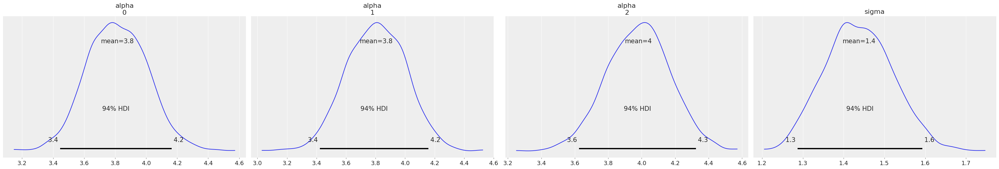

In [ ]:
az.plot_posterior(trace_A5)

**MODEL 5 analysis:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

the variations in alpha do not show much of a difference between session 1 and session 2's case in NOP predictions. So there might be some tendency to pump the balloons more as the participant gets to the last session (the mean number of pumps across trials). While there are some differences we can observe in session 3 (Although the HDIs are still intersecting each other, we can observe that the mean HDI of session 3 is around 0.2 larger than the other 2 sessions. 0.2  is equal to 1 standard deviation, so we might have some small confidence in the result)

In [ ]:
with pm.Model() as m_A6:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1, shape = [3, 18], dims=["S", "particpant"])
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['S'], df2['participant']]
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A6 = pm.sample()

In [ ]:
az.plot_trace(trace_A6, compact=False)

In [ ]:
az.summary(trace_A6)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha[0, 0]",2.576,0.860,0.903,4.153,0.014,0.011,3665.0,1420.0,1.0
"alpha[0, 1]",2.054,0.805,0.548,3.521,0.012,0.009,4731.0,1343.0,1.0
"alpha[0, 2]",1.688,0.814,0.157,3.291,0.013,0.010,4170.0,1299.0,1.0
"alpha[0, 3]",1.907,0.843,0.318,3.488,0.012,0.010,4839.0,1066.0,1.0
"alpha[0, 4]",1.798,0.845,0.266,3.379,0.013,0.011,3971.0,1610.0,1.0
"alpha[0, 5]",1.622,0.823,0.128,3.106,0.013,0.011,4150.0,1712.0,1.0
"alpha[0, 6]",2.394,0.861,0.708,3.915,0.013,0.010,4573.0,1496.0,1.0
"alpha[0, 7]",2.172,0.860,0.514,3.703,0.014,0.011,3987.0,1449.0,1.0
"alpha[0, 8]",2.595,0.810,1.131,4.182,0.013,0.010,3627.0,1253.0,1.0
"alpha[0, 9]",1.649,0.817,0.198,3.186,0.015,0.011,2982.0,1697.0,1.0


/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (55) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'}>],
       [<Axes: title={'center': 'alpha\n0, 12'}>,
        <Axes: title={'center': 'alpha\n0, 13'}>,
        <Axes: title={'center': 'alpha\n0, 14'}>,
        <Axes: title={'center': 'alpha\n0, 15'}>],
       [<Axes: title={'center': 'alpha\n0, 16'}>,
        <Axes: title={'center': 'alpha\n0, 17'}>,
        <Axes: title={'center': 'alpha\n1, 0'}>,
        <Axes: title={'center': 'alpha\n1, 1'}>],
       

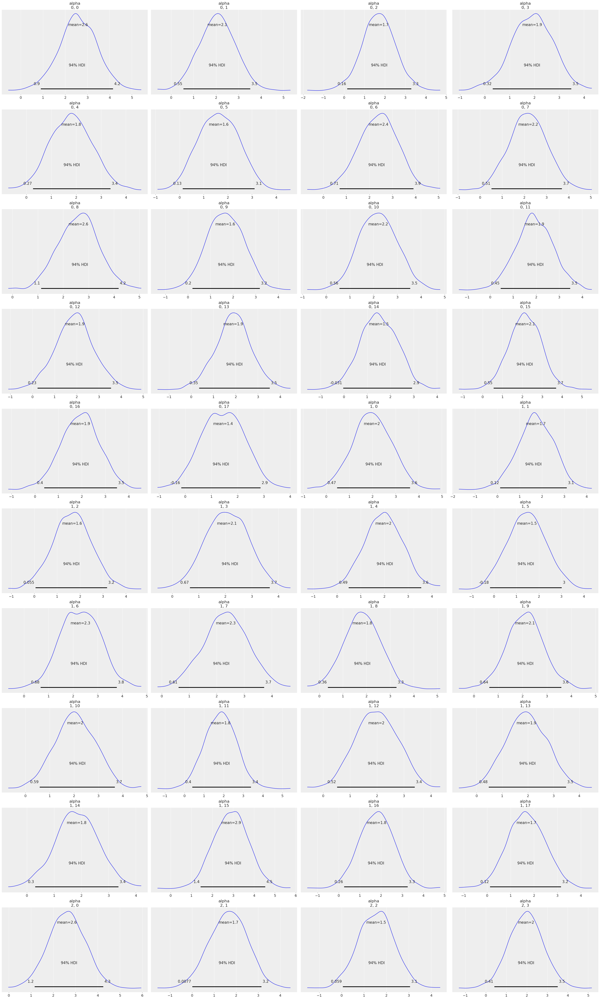

In [ ]:
az.plot_posterior(trace_A6)

**MODEL 6 analysis:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that the result here shows us a much better picture of the situation compared to the previous model: It could be seen that some participants start their first sessions by acting risky, while getting more careful in the 2nd session and then taking some risks again in the last trial. An example of these participants is particiant 1 (index 0) who had the number of their mean pumps go from 2.5 to 1.9 to 2.3 in the 3 sessions among the participants, this person seemed to be the most effected by the changes in sessions, together with participant 9 (index 8)). There also also some participants who decide to act more carefully in their first sessions and they start to take more risks and the pump balloons more as they get to their next trials. Such as participant 18 had the number of their mean pumps go from 1.4 to 1.6 to 1.9.



In [ ]:
with pm.Model() as m_A7:
    alpha = pm.Normal('alpha', mu = 0.2, sigma = 0.3, shape = 3, dims="S")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['S']]
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A7 = pm.sample()

In [ ]:
az.plot_trace(trace_A7, compact=False)

In [ ]:
az.summary(trace_A7)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],0.546,0.022,0.506,0.588,0.0,0.0,3294.0,1595.0,1.0
alpha[1],0.525,0.022,0.482,0.564,0.0,0.0,2930.0,1587.0,1.0
alpha[2],0.543,0.022,0.505,0.588,0.0,0.0,2981.0,1482.0,1.0
sigma,0.163,0.009,0.146,0.181,0.0,0.0,3231.0,1535.0,1.0


array([<Axes: title={'center': 'alpha\n0'}>,
       <Axes: title={'center': 'alpha\n1'}>,
       <Axes: title={'center': 'alpha\n2'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

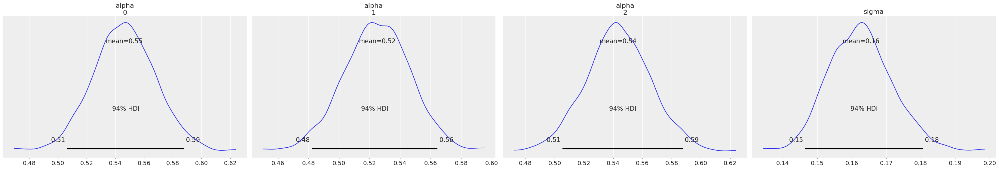

In [ ]:
az.plot_posterior(trace_A7)

**MODEL 7 analysis:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We fail to observe much of a difference in the proportion of cashed trials based on the sesion order here. Because our HDIs intersect with each other a lot.


In [ ]:
with pm.Model() as m_A8:
    alpha = pm.Normal('alpha', mu = 0.2, sigma = 0.3, shape = [3, 18], dims=["S", "particpant"])
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['S'], df2['participant']]
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A8 = pm.sample()

In [ ]:
az.plot_trace(trace_A8, compact=False)

In [ ]:
az.summary(trace_A8)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha[0, 0]",0.339,0.057,0.236,0.446,0.001,0.001,2812.0,1494.0,1.00
"alpha[0, 1]",0.575,0.060,0.466,0.689,0.001,0.001,3678.0,1215.0,1.00
"alpha[0, 2]",0.606,0.058,0.497,0.706,0.001,0.001,4095.0,1570.0,1.00
"alpha[0, 3]",0.636,0.060,0.520,0.745,0.001,0.001,3053.0,1556.0,1.00
"alpha[0, 4]",0.552,0.061,0.441,0.667,0.001,0.001,3038.0,1296.0,1.00
"alpha[0, 5]",0.712,0.059,0.605,0.827,0.001,0.001,3531.0,1070.0,1.00
"alpha[0, 6]",0.414,0.060,0.304,0.526,0.001,0.001,3383.0,1365.0,1.00
"alpha[0, 7]",0.330,0.057,0.224,0.438,0.001,0.001,3753.0,1474.0,1.00
"alpha[0, 8]",0.434,0.059,0.330,0.554,0.001,0.001,3516.0,1192.0,1.00
"alpha[0, 9]",0.595,0.059,0.491,0.711,0.001,0.001,3307.0,1285.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (55) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'}>],
       [<Axes: title={'center': 'alpha\n0, 12'}>,
        <Axes: title={'center': 'alpha\n0, 13'}>,
        <Axes: title={'center': 'alpha\n0, 14'}>,
        <Axes: title={'center': 'alpha\n0, 15'}>],
       [<Axes: title={'center': 'alpha\n0, 16'}>,
        <Axes: title={'center': 'alpha\n0, 17'}>,
        <Axes: title={'center': 'alpha\n1, 0'}>,
        <Axes: title={'center': 'alpha\n1, 1'}>],
       

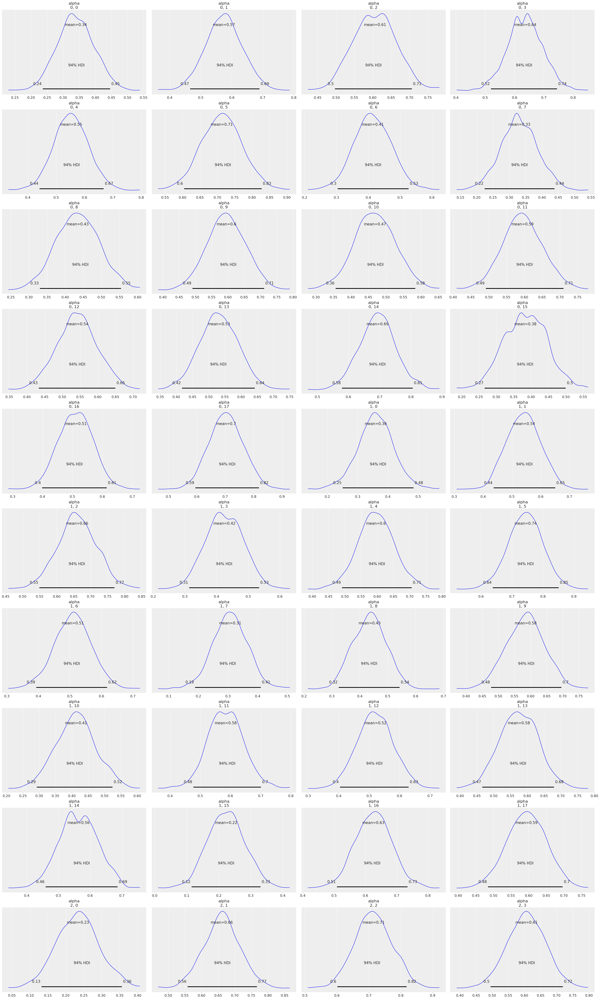

In [ ]:
az.plot_posterior(trace_A8)

**MODEL 8 analysis:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe the way each participant is affected by the session order is different here. For example, participant 18 is positively affected during the session and s/he experiences a constant increase in the predicted mean HDI of pC (although the HDIs intersect a lot. And participant 16 (index 15) experiences a relatively significant decrease in the mean HDI pC as s/he passes trhough the sessions (this person seems to be most significantly effected here. just as we mentioned this person in models 2 and 4 because of the way they got effected by alcohol).

However, The close HDIs make us have less confidence in our analysis here.

### 3.
$B \rightarrow NOP$
and $A \rightarrow pC$

Model 9: 1 model for all participants: This model could be used for estimating the direct and total causal effect of $B \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{B[i]}
\\
  \alpha_{k} &\sim \text{Normal}(1, 1)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 10: data from different participants:This model could be used for estimating the total and direct causal effect for $B \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{B[i], participant[i]}
\\
  \alpha_{k, l} &\sim \text{Normal}(1,1)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 11: 1 model for all participants: This model could be used for estimating the total causal effect for $B \rightarrow pC$ and the

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{B[i]}
\\
  \alpha_{k} &\sim \text{Normal}(0.2, 0.3)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 12: data from different participants:This model could be used for estimating the total causal effect for $B \rightarrow pC$:

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{B[i], participant[i]}
\\
  \alpha_{k, l} &\sim \text{Normal}(0.2, 0.3)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

--> No model could be used in order to find the direct effect of $B \rightarrow pC$: the moment we add NOP to our model, we are also opening multiple fork paths (or collider paths, depending on how we look at it) that come from A, C, and PB, none of which could be closed because there also exists a collider between each them and B.

In [19]:
df2['B'] = df2['block'] - 1

In [ ]:
with pm.Model() as m_A9:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1, shape = 3, dims="B")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['B']]
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A9 = pm.sample()

In [ ]:
az.plot_trace(trace_A9, compact=False)

In [ ]:
az.summary(trace_A9)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],3.900,0.196,3.546,4.259,0.004,0.003,2973.0,1525.0,1.0
alpha[1],4.007,0.193,3.626,4.352,0.004,0.002,3014.0,1747.0,1.0
alpha[2],3.693,0.187,3.348,4.050,0.003,0.002,3310.0,1522.0,1.0
sigma,1.431,0.083,1.272,1.579,0.002,0.001,2207.0,1695.0,1.0


array([<Axes: title={'center': 'alpha\n0'}>,
       <Axes: title={'center': 'alpha\n1'}>,
       <Axes: title={'center': 'alpha\n2'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

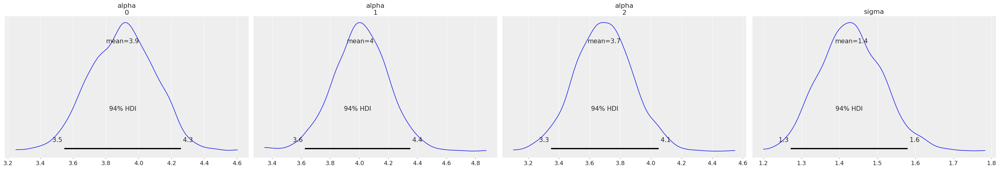

In [ ]:
az.plot_posterior(trace_A9)

**MODEL 9:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that there is a small and not significant increase in NOP from the 1st block to the 2nd block. But then we experience a step of size 2 standard deviations (our SDs are ~0.19) from block 2 to block 3, which could give a relatively significant result that, in general, there seems to be a decrease in the number of mean pumps between blocks 1 and 2 compared with block 3.



In [ ]:
with pm.Model() as m_A10:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1, shape = [3, 18], dims=["B", "particpant"])
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['B'], df2['participant']]
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A10 = pm.sample()

In [ ]:
az.plot_trace(trace_A10, compact=False)

In [ ]:
az.summary(trace_A10)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha[0, 0]",2.304,0.822,0.724,3.797,0.014,0.011,3420.0,1336.0,1.01
"alpha[0, 1]",2.132,0.790,0.510,3.505,0.013,0.010,3860.0,1524.0,1.00
"alpha[0, 2]",1.914,0.810,0.371,3.392,0.012,0.011,4216.0,1210.0,1.00
"alpha[0, 3]",2.009,0.824,0.467,3.520,0.012,0.010,4797.0,1729.0,1.01
"alpha[0, 4]",1.899,0.845,0.353,3.567,0.013,0.011,4254.0,1251.0,1.00
"alpha[0, 5]",1.726,0.834,0.115,3.176,0.012,0.011,4685.0,1372.0,1.00
"alpha[0, 6]",2.056,0.864,0.304,3.635,0.014,0.011,4058.0,1306.0,1.00
"alpha[0, 7]",2.249,0.814,0.839,3.887,0.014,0.011,3440.0,1326.0,1.00
"alpha[0, 8]",2.373,0.835,0.735,3.869,0.012,0.010,4403.0,1474.0,1.00
"alpha[0, 9]",2.067,0.837,0.487,3.759,0.012,0.010,5078.0,1144.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (55) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'}>],
       [<Axes: title={'center': 'alpha\n0, 12'}>,
        <Axes: title={'center': 'alpha\n0, 13'}>,
        <Axes: title={'center': 'alpha\n0, 14'}>,
        <Axes: title={'center': 'alpha\n0, 15'}>],
       [<Axes: title={'center': 'alpha\n0, 16'}>,
        <Axes: title={'center': 'alpha\n0, 17'}>,
        <Axes: title={'center': 'alpha\n1, 0'}>,
        <Axes: title={'center': 'alpha\n1, 1'}>],
       

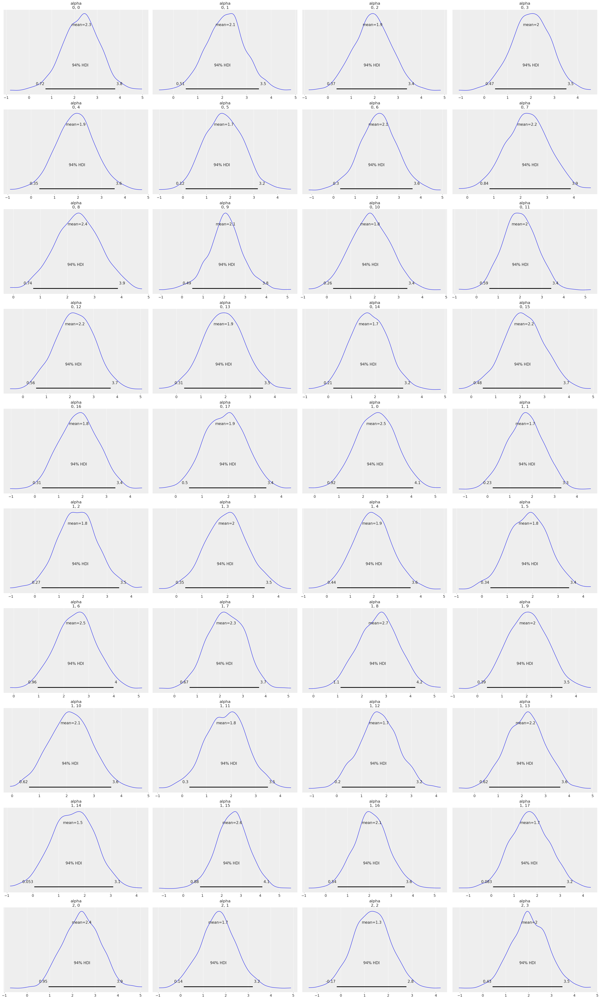

In [ ]:
az.plot_posterior(trace_A10)

**MODEL 10:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

Observe that participants 1 and 9 (index 0 and 8) seem to be the participants with relatively significant changes here, which is a noteworthy result, considering that these 2 participants also showed us a significant result in our analysis of model 6, where we were checking the effects of the session order on each participants mean pump.

Although, the most interesting effect here is shown in Participant 16 (index 15). This participant shows constant growth in their HDI predictions throughout the 3 blocks. They start with a 2.1 mean pump prediction and grow to 2.5 in block 2. Then, they have a sudden jump to 3.3 in the last block. Remember that participant 16 was also a notheworthy case in models 2, 4, and 8 where we were analyzing the effects of alcohol and session orders on NOP and pC.



In [ ]:
with pm.Model() as m_A11:
    alpha = pm.Normal('alpha', mu = 0.2, sigma = 0.3, shape = 3, dims="B")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['B']]
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A11 = pm.sample()

In [ ]:
az.plot_trace(trace_A11, compact=False)

In [ ]:
az.summary(trace_A11)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],0.516,0.023,0.474,0.560,0.0,0.0,3051.0,1667.0,1.0
alpha[1],0.542,0.022,0.499,0.582,0.0,0.0,2828.0,1496.0,1.0
alpha[2],0.555,0.022,0.513,0.596,0.0,0.0,3233.0,1796.0,1.0
sigma,0.162,0.009,0.145,0.179,0.0,0.0,2641.0,1665.0,1.0


array([<Axes: title={'center': 'alpha\n0'}>,
       <Axes: title={'center': 'alpha\n1'}>,
       <Axes: title={'center': 'alpha\n2'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

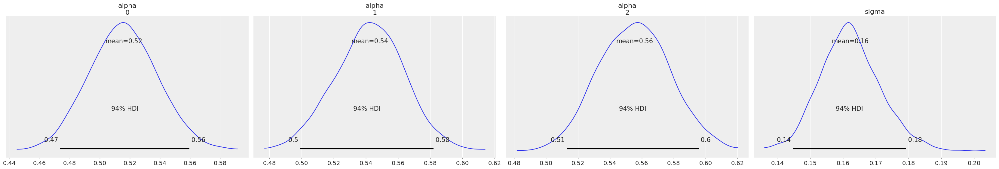

In [ ]:
az.plot_posterior(trace_A11)

**MODEL 11:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that as participants go from block 1 to block 3, their predicted HDI mean increases. So there could be a small effect of the block order on the proportion of cashed trials.

Although, similar to previous trials we have some problems with the intersected area of HDI which doesn't seem that small (it takes around 2 standard deviations).



In [ ]:
with pm.Model() as m_A12:
    alpha = pm.Normal('alpha', mu = 0.2, sigma = 0.3, shape = [3, 18], dims=["B", "particpant"])
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['B'], df2['participant']]
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A12 = pm.sample()

In [ ]:
az.plot_trace(trace_A12, compact=False)

In [ ]:
az.summary(trace_A12)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha[0, 0]",0.338,0.060,0.230,0.453,0.001,0.001,4349.0,1271.0,1.00
"alpha[0, 1]",0.595,0.057,0.486,0.703,0.001,0.001,3626.0,1455.0,1.00
"alpha[0, 2]",0.584,0.059,0.477,0.694,0.001,0.001,3732.0,1180.0,1.00
"alpha[0, 3]",0.565,0.060,0.456,0.678,0.001,0.001,3557.0,1456.0,1.00
"alpha[0, 4]",0.541,0.062,0.420,0.657,0.001,0.001,3370.0,1500.0,1.01
"alpha[0, 5]",0.658,0.057,0.551,0.760,0.001,0.001,3616.0,1511.0,1.00
"alpha[0, 6]",0.414,0.061,0.295,0.520,0.001,0.001,3931.0,1305.0,1.00
"alpha[0, 7]",0.338,0.059,0.230,0.448,0.001,0.001,2693.0,1413.0,1.00
"alpha[0, 8]",0.414,0.058,0.312,0.529,0.001,0.001,3423.0,1275.0,1.00
"alpha[0, 9]",0.531,0.061,0.418,0.646,0.001,0.001,3120.0,1251.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (55) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'}>],
       [<Axes: title={'center': 'alpha\n0, 12'}>,
        <Axes: title={'center': 'alpha\n0, 13'}>,
        <Axes: title={'center': 'alpha\n0, 14'}>,
        <Axes: title={'center': 'alpha\n0, 15'}>],
       [<Axes: title={'center': 'alpha\n0, 16'}>,
        <Axes: title={'center': 'alpha\n0, 17'}>,
        <Axes: title={'center': 'alpha\n1, 0'}>,
        <Axes: title={'center': 'alpha\n1, 1'}>],
       

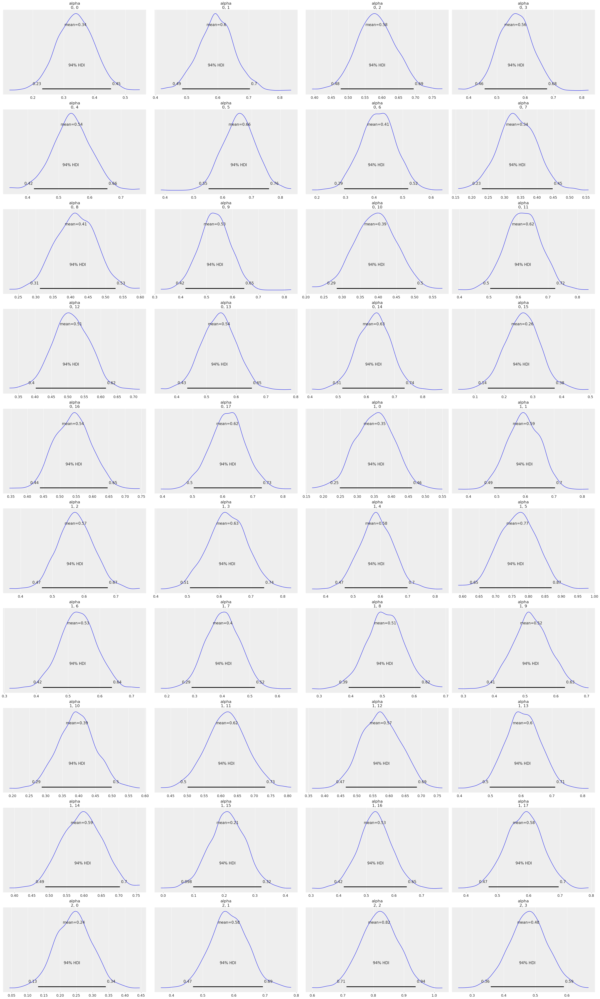

In [ ]:
az.plot_posterior(trace_A12)

**MODEL 12:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

We can observe that each participant shows a different way of getting affected here. but the most noteworthy ones are participants 3, 15, and 18. We can observe that their mean HDi increases as they move from block 1 to block 3 and they show a significant increase in their proportion of cashed trials, such that there is a very small intersection between their HDIs of block 1 and block 3, which gives us a high confidence in our result here.

### 4.
$PB \rightarrow NOP$
and $PB \rightarrow pC$

Model 13: 1 model for all participants: This model could be used for estimating the direct and total causal effect of $PB \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha + \beta_{PB} * PB_i
\\
  \alpha &\sim \text{Normal}(1,1)
\\
  \beta_{PB} &\sim \text{Normal}(-1,0.5)
\\
  \sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 14: data from different participants:This model could be used for estimating the total and direct causal effect for $PB \rightarrow NOP$:

$$
\begin{align*}
  NOP &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{participant[i]} + \beta_{PB} * PB_i
\\
  \alpha_{j} &\sim \text{Normal}(1,1)
\\
  \beta_{PB} &\sim \text{Normal}(-1,0.5)
\\
  \sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 15: 1 model for all participants: This model could be used for estimating the total causal effect for $PB \rightarrow pC$ and the

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha + \beta_{PB} * PB_i
\\
  \alpha &\sim \text{Normal}(0.1,0.3)
\\
  \beta_{PB} &\sim \text{Normal}(0,0.5)
\\
  \sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 16: data from different participants:This model could be used for estimating the total causal effect for $PB \rightarrow pC$:

$$
\begin{align*}
  pC &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{participant[i]} + \beta_{PB} * PB_i
\\
  \alpha_{j} &\sim \text{Normal}(0.1,0.3)
\\
  \beta_{PB} &\sim \text{Normal}(0,0.5)
\\
  \sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

--> No model could be used to find the direct effect of $PB \rightarrow pC$: the moment we add NOP to our model, we are also opening multiple fork paths that come from A, C, and B, none of which could be closed because there also exists a collider between each them and PB.

In the bellow models I will use the standardized version of PB

In [ ]:
with pm.Model() as m_A13:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1)
    beta = pm.Normal('beta', mu = -1, sigma = 0.5)
    sigma = pm.Exponential('sigma', 1)
    mu = alpha + beta * df2['PB_s']
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A13 = pm.sample()

In [ ]:
az.plot_trace(trace_A13, compact=False)

In [ ]:
az.summary(trace_A13)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,3.950,0.089,3.788,4.124,0.002,0.001,2958.0,1579.0,1.0
beta,-0.809,0.092,-0.987,-0.641,0.002,0.001,2973.0,1646.0,1.0
sigma,1.181,0.065,1.056,1.300,0.001,0.001,2768.0,1527.0,1.0


array([<Axes: title={'center': 'alpha'}>,
       <Axes: title={'center': 'beta'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

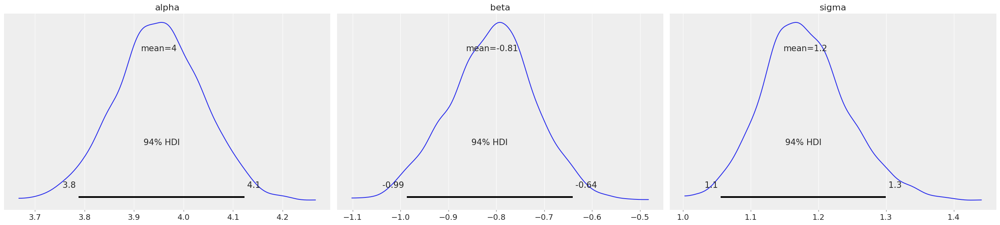

In [ ]:
az.plot_posterior(trace_A13)

**MODEL 13:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

Here, we observe that both the lower and upper bounds of the 97% DHI are negative. So, we can claim with a 97% confidence in our results that we expect that as the burst probability of balloons increases, the participants also get more cautious and pump the balloons less than before.

In [ ]:
with pm.Model() as m_A14:
    alpha = pm.Normal('alpha', mu = 1, sigma = 1, shape = 18, dims="particpant")
    beta = pm.Normal('beta', mu = -1, sigma = 0.5, shape = 18, dims="particpant")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['participant']] + beta[df2['participant']] * df2['PB_s']
    NOP = pm.Normal('NOP', mu = mu,  sigma = sigma, observed = df2["NOP"])
    trace_A14 = pm.sample()

In [ ]:
az.plot_trace(trace_A14, compact=False)

In [ ]:
az.summary(trace_A14)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],4.822,0.314,4.225,5.380,0.005,0.003,4369.0,1629.0,1.01
alpha[1],3.223,0.301,2.665,3.791,0.005,0.003,4018.0,1358.0,1.00
alpha[2],2.761,0.289,2.213,3.300,0.004,0.003,4655.0,1380.0,1.00
alpha[3],3.688,0.307,3.161,4.257,0.004,0.003,5449.0,1382.0,1.00
alpha[4],3.383,0.313,2.809,3.960,0.005,0.004,3974.0,1439.0,1.00
alpha[5],2.845,0.302,2.315,3.449,0.005,0.004,3255.0,1666.0,1.00
alpha[6],4.563,0.310,4.003,5.152,0.005,0.004,3944.0,1422.0,1.00
alpha[7],4.152,0.318,3.537,4.731,0.005,0.003,4923.0,1433.0,1.00
alpha[8],4.334,0.310,3.747,4.933,0.005,0.003,4128.0,1403.0,1.00
alpha[9],3.564,0.309,2.992,4.120,0.005,0.003,4342.0,1617.0,1.00


array([[<Axes: title={'center': 'alpha\n0'}>,
        <Axes: title={'center': 'alpha\n1'}>,
        <Axes: title={'center': 'alpha\n2'}>,
        <Axes: title={'center': 'alpha\n3'}>],
       [<Axes: title={'center': 'alpha\n4'}>,
        <Axes: title={'center': 'alpha\n5'}>,
        <Axes: title={'center': 'alpha\n6'}>,
        <Axes: title={'center': 'alpha\n7'}>],
       [<Axes: title={'center': 'alpha\n8'}>,
        <Axes: title={'center': 'alpha\n9'}>,
        <Axes: title={'center': 'alpha\n10'}>,
        <Axes: title={'center': 'alpha\n11'}>],
       [<Axes: title={'center': 'alpha\n12'}>,
        <Axes: title={'center': 'alpha\n13'}>,
        <Axes: title={'center': 'alpha\n14'}>,
        <Axes: title={'center': 'alpha\n15'}>],
       [<Axes: title={'center': 'alpha\n16'}>,
        <Axes: title={'center': 'alpha\n17'}>,
        <Axes: title={'center': 'beta'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

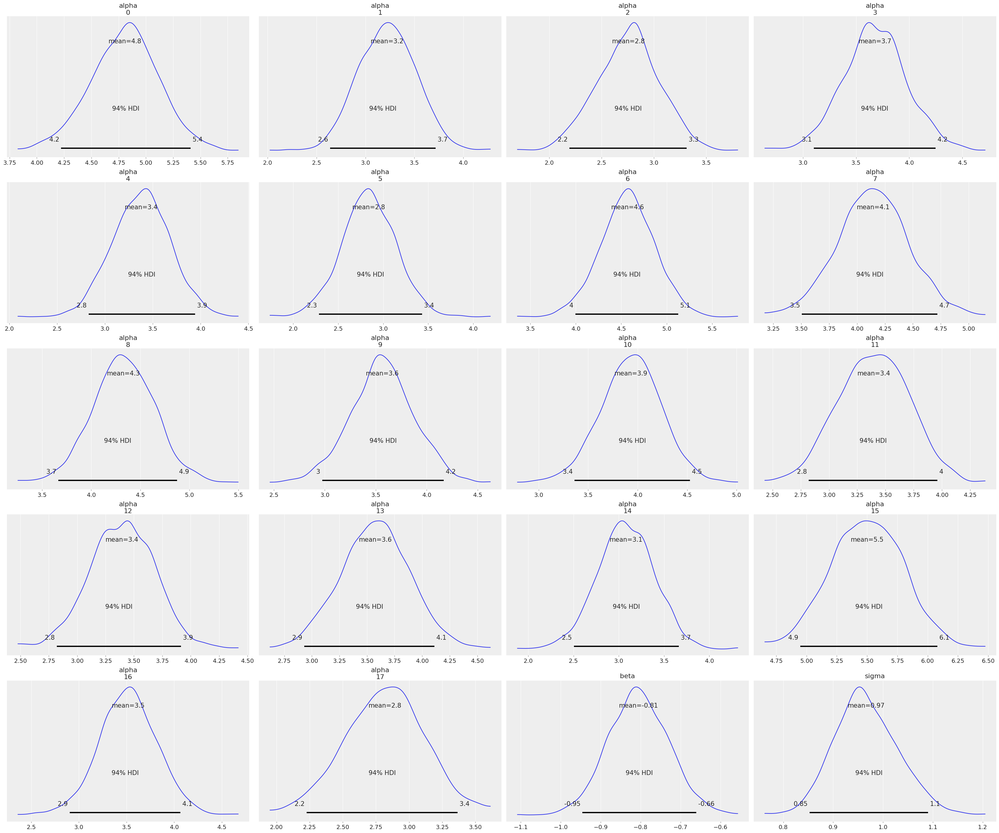

In [ ]:
az.plot_posterior(trace_A14)

**MODEL 14:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

Here, we have 18 predicted regression lines, one for each participant. It could be seen that the 97% HDi for all participants lies in the negative region. Thus, the conclusion of model 13 stays the same: as PB increases we expect NOP to decrease.

Some noteworthy participants here would be participants 16 and 9 (index 15 and 8). It could be seen that these 2 participants are the most cautious when it comes to the PB value and they have been affected the most by it.

It is worth mentioning that Participant 9 also showed us noteworthy effects in models 6 and 10, where we were analyzing the effects of blocks and sessions on pC. Participant 16 also had significant results in models 2, 4, 8, and 10 especially because of the effects of block order and alcohol on their pC and NOP.

In [ ]:
with pm.Model() as m_A15:
    A = pm.MutableData('A', df2["A"])
    alpha = pm.Normal('alpha', mu = 0.1, sigma = 0.3)
    beta = pm.Normal('beta', mu = 0, sigma = 0.5)
    sigma = pm.Exponential('sigma', 1)
    mu = alpha + beta * df2['PB_s']
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A15 = pm.sample()

In [ ]:
az.plot_trace(trace_A15, compact=False)

In [ ]:
az.summary(trace_A15)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.539,0.013,0.516,0.564,0.0,0.0,3224.0,1295.0,1.0
beta,-0.020,0.013,-0.045,0.003,0.0,0.0,3539.0,1287.0,1.0
sigma,0.161,0.009,0.144,0.178,0.0,0.0,2487.0,1639.0,1.0


In [ ]:
az.summary(trace_A15, hdi_prob = 0.87)

,mean,sd,hdi_6.5%,hdi_93.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.539,0.013,0.520,0.557,0.0,0.0,3224.0,1295.0,1.0
beta,-0.020,0.013,-0.039,-0.001,0.0,0.0,3539.0,1287.0,1.0
sigma,0.161,0.009,0.147,0.174,0.0,0.0,2487.0,1639.0,1.0


array([<Axes: title={'center': 'alpha'}>,
       <Axes: title={'center': 'beta'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

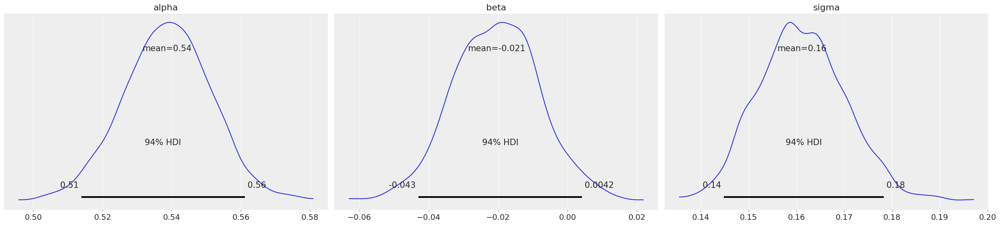

In [ ]:
az.plot_posterior(trace_A15)

**MODEL 15:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

Here, we can observe that the value 0 is contained within the 97% HDI of beta. This shows us that it is possible that the change of PB does not have much effect on the proportion of cashed trials. Which does also align with my prior.

But we can also notice that the 0 value is very close to the boundary of our HDI. And as we can see in the table that I reduced the HDI probablity to 87%, in such a case, we can indeed claim that as the burst probability of balloons increases, the proportion of the cashed trials decreases a small number.

In [ ]:
with pm.Model() as m_A16:
    A = pm.MutableData('A', df2["A"])
    alpha = pm.Normal('alpha', mu = 0.1, sigma = 0.3, shape = 18, dims="particpant")
    beta = pm.Normal('beta', mu = 0, sigma = 0.5, shape = 18, dims="particpant")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['participant']] + beta[df2['participant']] * df2['PB_s']
    pC = pm.Normal('pC', mu = mu,  sigma = sigma, observed = df2["pC"])
    trace_A16 = pm.sample()

In [ ]:
az.plot_trace(trace_A16, compact=False)

In [ ]:
az.summary(trace_A16)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],0.311,0.035,0.244,0.376,0.001,0.000,4621.0,1409.0,1.00
alpha[1],0.600,0.035,0.539,0.671,0.000,0.000,4976.0,1531.0,1.00
alpha[2],0.670,0.037,0.598,0.734,0.001,0.000,4604.0,1076.0,1.00
alpha[3],0.564,0.035,0.498,0.628,0.001,0.000,3701.0,1415.0,1.00
alpha[4],0.593,0.035,0.527,0.662,0.000,0.000,5287.0,1454.0,1.00
alpha[5],0.711,0.036,0.645,0.781,0.000,0.000,5622.0,1332.0,1.00
alpha[6],0.473,0.036,0.405,0.538,0.001,0.000,4725.0,1437.0,1.00
alpha[7],0.348,0.036,0.279,0.412,0.000,0.000,5153.0,1304.0,1.00
alpha[8],0.462,0.035,0.398,0.531,0.001,0.000,4392.0,1241.0,1.00
alpha[9],0.553,0.035,0.488,0.619,0.001,0.000,3644.0,1506.0,1.00


array([[<Axes: title={'center': 'alpha\n0'}>,
        <Axes: title={'center': 'alpha\n1'}>,
        <Axes: title={'center': 'alpha\n2'}>,
        <Axes: title={'center': 'alpha\n3'}>],
       [<Axes: title={'center': 'alpha\n4'}>,
        <Axes: title={'center': 'alpha\n5'}>,
        <Axes: title={'center': 'alpha\n6'}>,
        <Axes: title={'center': 'alpha\n7'}>],
       [<Axes: title={'center': 'alpha\n8'}>,
        <Axes: title={'center': 'alpha\n9'}>,
        <Axes: title={'center': 'alpha\n10'}>,
        <Axes: title={'center': 'alpha\n11'}>],
       [<Axes: title={'center': 'alpha\n12'}>,
        <Axes: title={'center': 'alpha\n13'}>,
        <Axes: title={'center': 'alpha\n14'}>,
        <Axes: title={'center': 'alpha\n15'}>],
       [<Axes: title={'center': 'alpha\n16'}>,
        <Axes: title={'center': 'alpha\n17'}>,
        <Axes: title={'center': 'beta'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

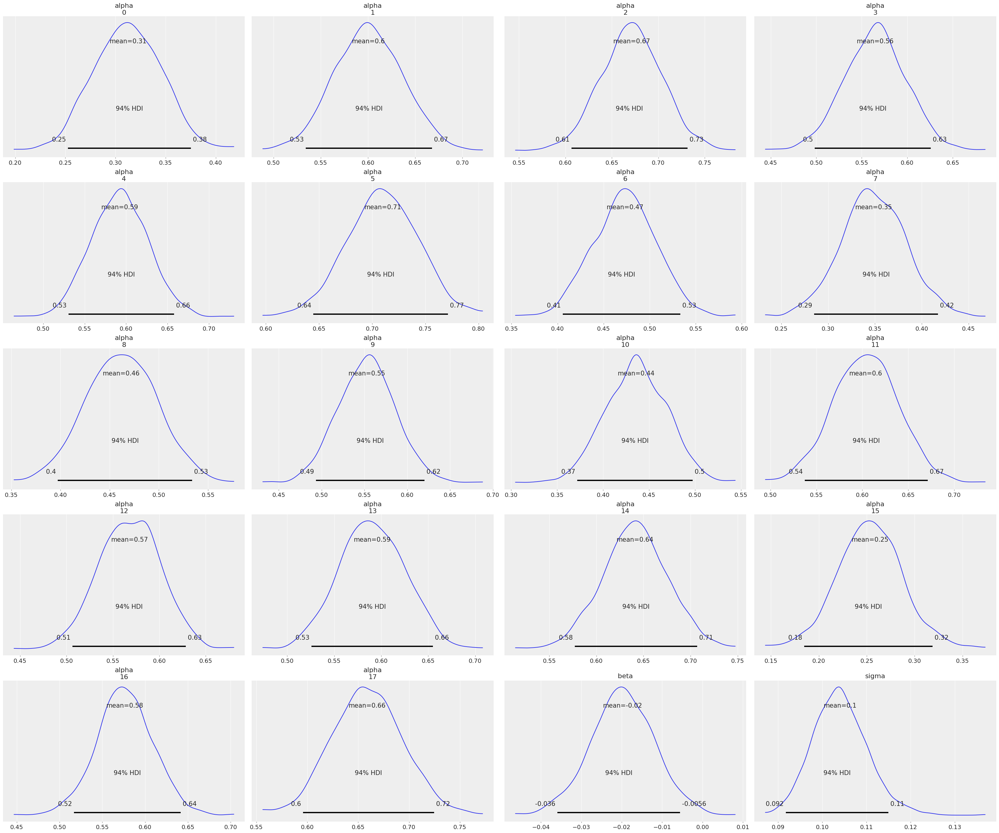

In [ ]:
az.plot_posterior(trace_A16)

**MODEL 16:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

Here, we can observe that the HDI of all beta values of different participants includes the value 0. This means we fail to conclude that as the burst probability increases, the cashed trial proportion of any of the participants changes. This could be because participants were notified of the PB values each time they started doing the BART. So they consciously made their choices based on their prior knowledge of PB.

The noteworthy participants in this model are participants 3 and 17. Because unlike other participants we can observe that a large majority of the HDI of these 2 participants' beta values is positive and not negative. Although the HDI of their beta values still includes the 0 value, so we can't take any conclusions with a high confidence.

### 5.
$A \rightarrow TR$

Model 17: 1 model for all participants: This model could be used for estimating the total causal effect of $A \rightarrow TR$:

$$
\begin{align*}
  TR &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{A[i]}
\\
  \alpha_{i} &\sim \text{Normal}(0, 0.5)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

Model 18: data from different participants:This model could be used for estimating the total causal effect for $A \rightarrow TR$:

$$
\begin{align*}
  TR &\sim \text{Normal}(\mu,\sigma)
\\
  \mu_i &= \alpha_{A[i], participant[i]}
\\
  \alpha_{k, l} &\sim \text{Normal}(0, 0.5)
\\
\sigma &\sim \text{Exponential}(1)
\\
\end{align*}
$$

--> No model could be used to find the direct effect of $A \rightarrow TR$: the moment we add NOP and pC to our model, we are also opening multiple fork paths that come from S, B, and PB, none of which could be closed because there also exists two colliders between each them and A.

In the below models I will use the standardized version of the TR

In [ ]:
with pm.Model() as m_A17:
    alpha = pm.Normal('alpha', mu = 0, sigma = 0.5, shape = 3, dims="A")
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['A']]
    TR = pm.Normal('TR', mu = mu,  sigma = sigma, observed = df2["TR_s"])
    trace_A17 = pm.sample()

In [ ]:
az.plot_trace(trace_A17, compact=False)

In [ ]:
az.summary(trace_A17)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],0.016,0.131,-0.213,0.276,0.002,0.003,2836.0,1575.0,1.0
alpha[1],-0.054,0.131,-0.303,0.193,0.002,0.003,3592.0,1471.0,1.0
alpha[2],0.031,0.129,-0.216,0.255,0.003,0.003,2274.0,1503.0,1.0
sigma,1.009,0.056,0.911,1.118,0.001,0.001,2823.0,1547.0,1.0


array([<Axes: title={'center': 'alpha\n0'}>,
       <Axes: title={'center': 'alpha\n1'}>,
       <Axes: title={'center': 'alpha\n2'}>,
       <Axes: title={'center': 'sigma'}>], dtype=object)

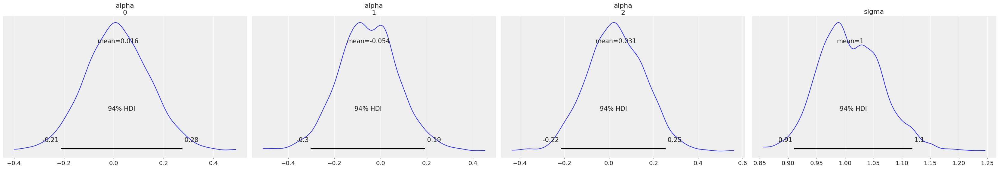

In [ ]:
az.plot_posterior(trace_A17)

**MODEL 17:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

Here, we observe that HDIs of different alpha values intersect each other in relatively large areas. So it doesn't seem like we can conclude for m=any significan difference in TR of participants in different conditions.

In [ ]:
with pm.Model() as m_A18:
    alpha = pm.Normal('alpha', mu = 0, sigma = 0.5, shape = [3, 18], dims=["A", "particpant"])
    sigma = pm.Exponential('sigma', 1)
    mu = alpha[df2['A'], df2['participant']]
    TR = pm.Normal('TR', mu = mu,  sigma = sigma, observed = df2["TR_s"])
    trace_A18 = pm.sample()

In [ ]:
az.plot_trace(trace_A18, compact=False)

In [ ]:
az.summary(trace_A18)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha[0, 0]",-0.101,0.362,-0.749,0.601,0.006,0.008,4194.0,1724.0,1.00
"alpha[0, 1]",-0.008,0.364,-0.670,0.701,0.006,0.010,3846.0,1405.0,1.00
"alpha[0, 2]",-0.441,0.375,-1.208,0.204,0.006,0.007,4059.0,1135.0,1.00
"alpha[0, 3]",-0.190,0.360,-0.837,0.473,0.005,0.008,4312.0,1366.0,1.00
"alpha[0, 4]",0.187,0.363,-0.482,0.863,0.006,0.008,3346.0,1471.0,1.00
"alpha[0, 5]",0.018,0.373,-0.713,0.695,0.006,0.010,4280.0,1440.0,1.00
"alpha[0, 6]",0.240,0.363,-0.474,0.882,0.006,0.007,3868.0,1609.0,1.00
"alpha[0, 7]",-0.250,0.379,-0.937,0.451,0.006,0.008,4227.0,1499.0,1.00
"alpha[0, 8]",0.441,0.378,-0.227,1.159,0.006,0.006,4185.0,1414.0,1.00
"alpha[0, 9]",-0.122,0.361,-0.865,0.502,0.006,0.009,4125.0,1522.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (55) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'}>],
       [<Axes: title={'center': 'alpha\n0, 12'}>,
        <Axes: title={'center': 'alpha\n0, 13'}>,
        <Axes: title={'center': 'alpha\n0, 14'}>,
        <Axes: title={'center': 'alpha\n0, 15'}>],
       [<Axes: title={'center': 'alpha\n0, 16'}>,
        <Axes: title={'center': 'alpha\n0, 17'}>,
        <Axes: title={'center': 'alpha\n1, 0'}>,
        <Axes: title={'center': 'alpha\n1, 1'}>],
       

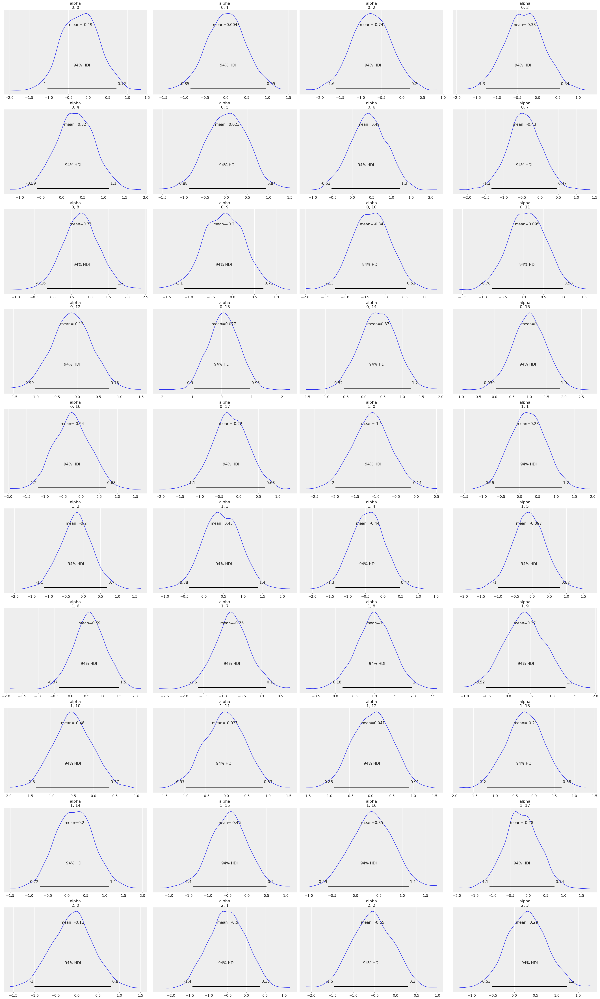

In [ ]:
az.plot_posterior(trace_A18)

**MODEL 17:**

Observe that ess and r_hat values do not show any problems with our model. The trace plots also have a random shape without any patterns which further shows our model has converged.

Here, we observe that the total reward of different participants is affected differently for each person. Some notable cases are: participants 3 and 5 who experience an decrease in TR when they go from sober to drunk (they have a small intersection in their HDI). And our most significant effects also comes from participants 9 and 16, which is not unexpected as these 2 participants were mentioned in multiple previous models when we were analysiing the effects of S, B, and A on NOP and pC. We can also observe that in the drunk case participant 9 and in the sober case participator 16 have the highers alpha predictions, both of which go trough changes as their alcohol state change.

# PART B - GENERALIZED LINEAR MODELS

### Part 1

Here we create a binomial regression model for cash-in trials. Assuming $C \sim \text{Binomial}(n, p)$ where $C$ is the count of cash-in trials within a block, $n=30$, and $p$ is the probability of cash-in.

In [20]:
def inv_logit(p):
    return np.exp(p) / (1 + np.exp(p))

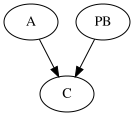

In [21]:
dot = Digraph()

# experimental
dot.node("A", "A") # alcohol condition
dot.node("PB", "PB") # probability of burst

# outcomes
dot.node("C", "C")

# edges
dot.edge("A", "C")
dot.edge("PB", "C")
dot

$$
\begin{align*}
  C &\sim \text{Binomial}(n=30,p)
\\
  logit(p_i) &=  \alpha_{participant[i]} + \beta_{A[i], PB[i]}
\\
  \alpha_j &\sim \text{Normal}(0, 0.9)
\\
 \beta_{k,l} &\sim \text{Normal}(0.5, 0.1)
\\
\end{align*}
$$

In [22]:
df2["PB_index"] = df2["p_burst"].replace({10: 1, 15: 2, 20: 3})-1

In [23]:
with pm.Model() as m_B1:
    alpha = pm.Normal("alpha", 0, 0.9, shape = 18, dims='participant')
    beta = pm.Normal('beta', 0.5, 0.1, shape = [3, 3], dims=['PB', 'A'])
    p = pm.math.invlogit(beta[df2["PB_index"], df2["A"]] + alpha[df2['participant']])
    A = pm.Binomial('A', p = p, n = 30, observed = df2["C"])
    idata = pm.sample_prior_predictive(samples=50)

In [24]:
idata

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

In [25]:
N = 1000
PB = np.random.choice([0, 1, 2], size = N)
A = np.random.choice([0, 1, 2], size = N)

x = np.array([1, 0])
samples = len(idata.prior.draw)
inv_logits = []
for i in [0, 1, 2]:
  for j in [0, 1, 2]:
    for k in range(18):
      alphas = idata.prior.alpha[:, :, k].values
      betas = idata.prior.beta[:, :, i, j].values

      inv_logits.append(inv_logit((alphas+betas).mean()))
      print(inv_logit((alphas+betas).mean()), ' average inv_logit(alpha + beta) for: participant', k, ' , A:', j, ' , PB:', i)

0.6544590807882644  average inv_logit(alpha + beta) for: participant 0  , A: 0  , PB: 0
0.6485064544908964  average inv_logit(alpha + beta) for: participant 1  , A: 0  , PB: 0
0.6501220978065685  average inv_logit(alpha + beta) for: participant 2  , A: 0  , PB: 0
0.5977387642151041  average inv_logit(alpha + beta) for: participant 3  , A: 0  , PB: 0
0.6265613390803205  average inv_logit(alpha + beta) for: participant 4  , A: 0  , PB: 0
0.6299478857366073  average inv_logit(alpha + beta) for: participant 5  , A: 0  , PB: 0
0.6399693732645781  average inv_logit(alpha + beta) for: participant 6  , A: 0  , PB: 0
0.6480880837365979  average inv_logit(alpha + beta) for: participant 7  , A: 0  , PB: 0
0.6613005980828177  average inv_logit(alpha + beta) for: participant 8  , A: 0  , PB: 0
0.6307647548650593  average inv_logit(alpha + beta) for: participant 9  , A: 0  , PB: 0
0.5831328283366116  average inv_logit(alpha + beta) for: participant 10  , A: 0  , PB: 0
0.6134926581208302  average inv

In [ ]:
x = np.array([0, 1, 2])
x_labels = ['0.10', '0.15', '0.2']

x2 = np.array([0, 1, 2])
x2_labels = ['drunk', 'tipsy', 'sober']

samples = len(idata.prior.draw)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):

            alphas = idata.prior.alpha[:, :, k].sel(draw=sample).values
            betas = idata.prior.beta[:, :, i, j].sel(draw=sample).values
            ax1.scatter(label, inv_logit((alphas.mean()+betas)), color='k', alpha=0.3)

for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):

            alphas = idata.prior.alpha[:, :, k].sel(draw=sample).values
            betas = idata.prior.beta[:, :, i, j].sel(draw=sample).values
            ax2.scatter(label2, inv_logit((alphas.mean()+betas)), color='k', alpha=0.3)
'''
for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):

            alphas = idata.prior.alpha[:, :, k].sel(draw=sample).values
            betas = idata.prior.beta[:, :, i, j].sel(draw=sample).values
            ax2.scatter(l, inv_logit((alphas+betas.mean())), color='k', alpha=0.3)
'''

The plots seem to work well with the data.

In [ ]:
C = np.random.binomial(n = 30, p = inv_logits)

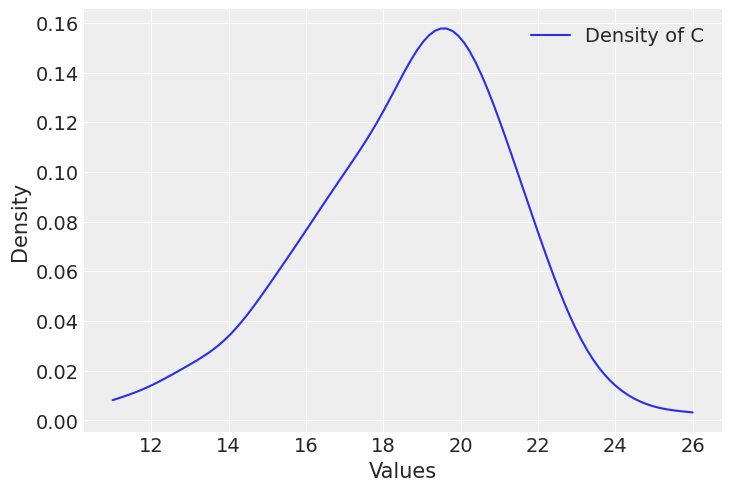

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

density = gaussian_kde(C)
x_values = np.linspace(min(C), max(C), 100)
y_values = density(x_values)

plt.plot(x_values, y_values, label='Density of C')
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()
plt.show()

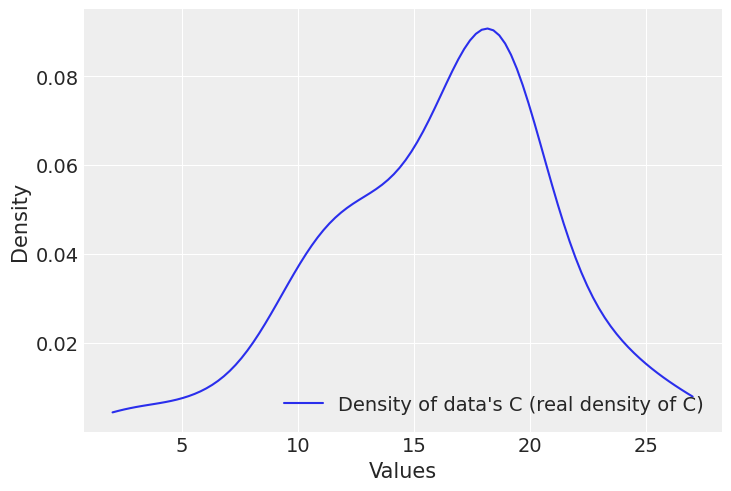

In [ ]:
density = gaussian_kde(df2['C'])
x_values = np.linspace(min(df2['C']), max(df2['C']), 100)
y_values = density(x_values)

plt.plot(x_values, y_values, label="Density of data's C (real density of C)")
plt.xlabel('Values')
plt.ylabel('Density')
plt.legend()
plt.show()

Our priors seem good enough for now. Although there is some difference in the left tail of the C, it's not that big for now.

In [ ]:
'''
N = 1000
# PB 0 applies to p_burst 0.1, PB 1 applies to p_burst 0.15, PB 2 applies to p_burst 0.2
PB = np.random.choice([0, 1, 2], size = N)
PB2 = np.select([PB == 0, PB == 1, PB == 2], [0.1, 0.15, 0.2])
PB3 = np.select([PB == 0, PB == 1, PB == 2], [0.5, 0.25, 0.1])
A = np.random.choice([0, 1, 2], size=N, p=[0.1, 0.3, 0.6])
A2 = np.select([A == 0, A == 1, A == 2], ['sober', 'tipsy', 'drunk'])
# matrix of cashed rates [Alcohol, PB]
cashed_alpha_index = np.array([[0.7,0.4,0.1]
                               ,[0.8,0.5,0.2]
                               ,[0.9,0.6,0.3]])
C = np.random.binomial(n = 30, p = cashed_alpha_index[PB,A])

d1 = pd.DataFrame({"C":C ,"A":A, "PB":PB2})

d1.groupby(['PB','A']).size()
'''

In [ ]:
with pm.Model() as m_B1:
    alpha = pm.Normal("alpha", 0, 0.9, shape = 18, dims='participant')
    beta = pm.Normal('beta', 0.5, 0.1, shape = [3, 3], dims=['PB', 'A'])
    p = pm.math.invlogit(beta[df2["PB_index"], df2["A"]] + alpha[df2['participant']])
    A = pm.Binomial('A', p = p, n = 30, observed = df2["C"])
    trace_B1 = pm.sample(idata_kwargs = {'log_likelihood': True})

In [ ]:
az.summary(trace_B1)

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],-1.248,0.134,-1.498,-0.994,0.002,0.001,4443.0,1582.0,1.00
alpha[1],-0.052,0.129,-0.291,0.184,0.002,0.003,3761.0,1561.0,1.00
alpha[2],0.248,0.138,-0.007,0.504,0.002,0.002,4738.0,1192.0,1.00
alpha[3],-0.205,0.129,-0.430,0.048,0.002,0.002,4520.0,1608.0,1.00
alpha[4],-0.086,0.129,-0.325,0.162,0.002,0.002,4106.0,1608.0,1.00
alpha[5],0.438,0.140,0.153,0.684,0.002,0.002,3801.0,1284.0,1.00
alpha[6],-0.572,0.125,-0.818,-0.344,0.002,0.002,3853.0,1439.0,1.00
alpha[7],-1.086,0.134,-1.353,-0.849,0.002,0.002,3553.0,1293.0,1.00
alpha[8],-0.616,0.120,-0.833,-0.386,0.002,0.002,3234.0,1480.0,1.00
alpha[9],-0.252,0.123,-0.481,-0.018,0.002,0.002,3430.0,1381.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (27), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0'}>,
        <Axes: title={'center': 'alpha\n0'}>],
       [<Axes: title={'center': 'alpha\n1'}>,
        <Axes: title={'center': 'alpha\n1'}>],
       [<Axes: title={'center': 'alpha\n2'}>,
        <Axes: title={'center': 'alpha\n2'}>],
       [<Axes: title={'center': 'alpha\n3'}>,
        <Axes: title={'center': 'alpha\n3'}>],
       [<Axes: title={'center': 'alpha\n4'}>,
        <Axes: title={'center': 'alpha\n4'}>],
       [<Axes: title={'center': 'alpha\n5'}>,
        <Axes: title={'center': 'alpha\n5'}>],
       [<Axes: title={'center': 'alpha\n6'}>,
        <Axes: title={'center': 'alpha\n6'}>],
       [<Axes: title={'center': 'alpha\n7'}>,
        <Axes: title={'center': 'alpha\n7'}>],
       [<Axes: title={'center': 'alpha\n8'}>,
        <Axes: title={'center': 'alpha\n8'}>],
       [<Axes: title={'center': 'alpha\n9'}>,
        <Axes: title={'center': 'alpha\n9'}>],
       [<Axes: title={'center': 'alpha\n10'}>,
        <Axes: title={'

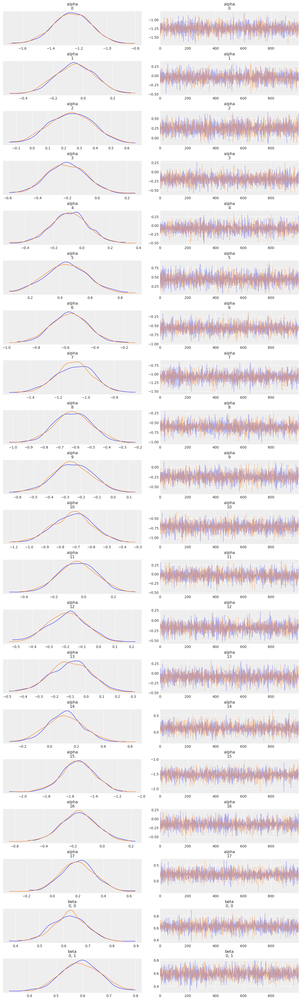

In [ ]:
az.plot_trace(trace_B1, compact=False)

r_hat values are all extremely close to 1.00 and the efficient sample size taken seems very good in the model. We can conclude that the sampling doesn't have any big problem here.

The trace plots also have a random shape without any patterns which further shows our model has converged.

To analyze the values of posteriors it is better to enter the probability space:

In [ ]:
inv_logit(az.summary(trace_B1)["mean"])

alpha[0]      0.230055
alpha[1]      0.474023
alpha[2]      0.542894
alpha[3]      0.437823
alpha[4]      0.466550
alpha[5]      0.586618
alpha[6]      0.357094
alpha[7]      0.256927
alpha[8]      0.347737
alpha[9]      0.428738
alpha[10]     0.326073
alpha[11]     0.477016
alpha[12]     0.442012
alpha[13]     0.463067
alpha[14]     0.512997
alpha[15]     0.189080
alpha[16]     0.449176
alpha[17]     0.531956
beta[0, 0]    0.664854
beta[0, 1]    0.658136
beta[0, 2]    0.637840
beta[1, 0]    0.610877
beta[1, 1]    0.641757
beta[1, 2]    0.620577
beta[2, 0]    0.613963
beta[2, 1]    0.629250
beta[2, 2]    0.638994
Name: mean, dtype: float64

We can observe that the beta values for different conditions and different probability bursts are extremely close to each other, and based on the summary table we can see they intersect each other for a large portion. This meets both our prior assumptions and the experimental assumptions of the data. We can observe that Participant 16 and 1 seem to have the lowest inverse logistic alpha (~binomial probability) for the count of cash-in trials within a block. and thus, the lowest chance to get high cash counts. While participant 6 has the highest chance (highest inverse logistic alpha).

### Part 2

Here I create a similar regression model where the outcome is whether the trial ends up with a cash-in or explosion. I assume $R \sim \text{Bernoulli}(p)$ where $R$ is the result at each trial, and $p$ is the probability of trial resulting in a cash-in.

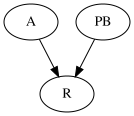

In [ ]:
dot = Digraph()

# experimental
dot.node("A", "A") # alcohol condition
dot.node("PB", "PB") # probability of burst

# outcomes
dot.node("R", "R") # result of a trial

# edges
dot.edge("A", "R")
dot.edge("PB", "R")
dot

In [ ]:
df['R'] = np.where(df['cash'] == 0, 0, 1)
df["PB"] = df["p_burst"].replace({10: 0, 15: 1, 20: 2})
df["A"] = pd.Categorical(df["condition"]).codes
df['A'] = df['A'].replace({0: 0, 2: 1, 1: 2})
df

,participant,condition,p_burst,trial,pumps,cash,total,session,block,explosion,R,PB,A
0,0,drunk,15,1,12,0.00,0.00,1,1,True,0,1,0
1,0,drunk,15,2,1,0.00,0.00,1,1,True,0,1,0
2,0,drunk,15,3,4,0.00,0.00,1,1,True,0,1,0
3,0,drunk,15,4,4,0.81,0.81,1,1,False,1,1,0
4,0,drunk,15,5,4,0.00,0.81,1,1,True,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4855,17,tipsy,20,26,3,0.79,12.20,3,3,False,1,2,1
4856,17,tipsy,20,27,1,0.00,12.20,3,3,True,0,2,1
4857,17,tipsy,20,28,2,0.63,12.83,3,3,False,1,2,1
4858,17,tipsy,20,29,2,0.63,13.46,3,3,False,1,2,1


$$
\begin{align*}
  R &\sim \text{Bernoulli}(p)
\\
  logit(p_i) &=  \alpha_{participant[i]} + \beta_{A[i], PB[i]}
\\
  \alpha_j &\sim \text{Normal}(-0.5, 0.1)
\\
 \beta_{k,l} &\sim \text{Normal}(0.5, 0.1)
\\
\end{align*}
$$

In [ ]:
with  pm.Model() as m_B2:
    alpha = pm.Normal("alpha", -0.5, 0.1, shape = 18, dims='participant')
    beta = pm.Normal('beta', 0.5, 0.1, shape = [3, 3], dims=['PB', 'A'])
    p = pm.math.invlogit(beta[df["PB"], df["A"]] + alpha[df['participant']])
    R = pm.Binomial('R', p = p, n = 1, observed = df["R"])
    idata2 = pm.sample_prior_predictive(samples=50)

PB = np.random.choice([0, 1, 2], size = N)
A = np.random.choice([0, 1, 2], size = N)

x = np.array([1, 0])
samples = len(idata.prior.draw)
inv_logits2 = []
for i in [0, 1, 2]:
  for j in [0, 1, 2]:
    for k in range(18):
      alphas = idata2.prior.alpha[:, :, k].values
      betas = idata2.prior.beta[:, :, i, j].values

      inv_logits2.append(inv_logit((alphas+betas).mean()))
      print(inv_logit((alphas+betas).mean()), ' average inv_logit(alpha + beta) for: participant', k, ' , A:', j, ' , PB:', i)

0.5051608169094476  average inv_logit(alpha + beta) for: participant 0  , A: 0  , PB: 0
0.5010174386214643  average inv_logit(alpha + beta) for: participant 1  , A: 0  , PB: 0
0.499965936925142  average inv_logit(alpha + beta) for: participant 2  , A: 0  , PB: 0
0.5024462137918254  average inv_logit(alpha + beta) for: participant 3  , A: 0  , PB: 0
0.5087667712685477  average inv_logit(alpha + beta) for: participant 4  , A: 0  , PB: 0
0.5095556132252445  average inv_logit(alpha + beta) for: participant 5  , A: 0  , PB: 0
0.5032502327597462  average inv_logit(alpha + beta) for: participant 6  , A: 0  , PB: 0
0.5071448506246548  average inv_logit(alpha + beta) for: participant 7  , A: 0  , PB: 0
0.508211293725251  average inv_logit(alpha + beta) for: participant 8  , A: 0  , PB: 0
0.5018647471218255  average inv_logit(alpha + beta) for: participant 9  , A: 0  , PB: 0
0.5003139531430911  average inv_logit(alpha + beta) for: participant 10  , A: 0  , PB: 0
0.4987747991478784  average inv_l

In [ ]:
'''
x = np.array([0, 1, 2])
x_labels = ['0.10', '0.15', '0.2']

x2 = np.array([0, 1, 2])
x2_labels = ['drunk', 'tipsy', 'sober']

samples = len(idata.prior.draw)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):

            alphas = idata2.prior.alpha[:, :, k].sel(draw=sample).values
            betas = idata2.prior.beta[:, :, i, j].sel(draw=sample).values
            ax1.scatter(label, inv_logit((alphas.mean()+betas)), color='k', alpha=0.3)

for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):

            alphas = idata2.prior.alpha[:, :, k].sel(draw=sample).values
            betas = idata2.prior.beta[:, :, i, j].sel(draw=sample).values
            ax2.scatter(label, inv_logit((alphas+betas.mean())), color='k', alpha=0.3)
'''

In [ ]:
R = np.random.binomial(n = 1, p = inv_logits2)

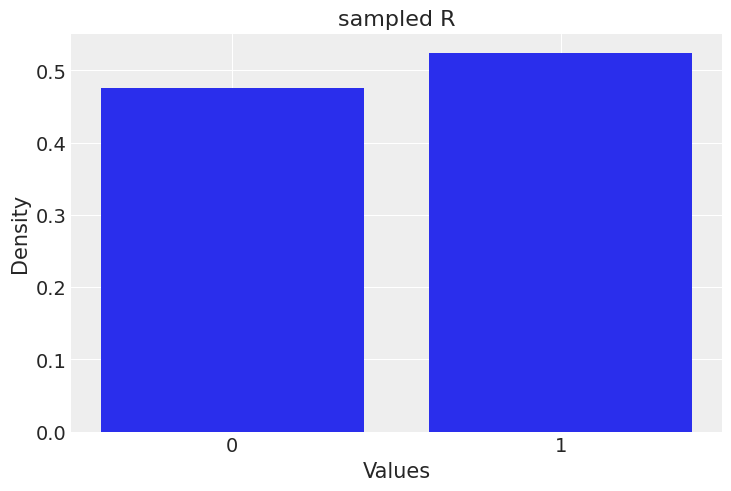

In [ ]:
counts = np.bincount(R) / len(R)

plt.bar([0, 1], counts, tick_label=['0', '1'])
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('sampled R')
plt.show()

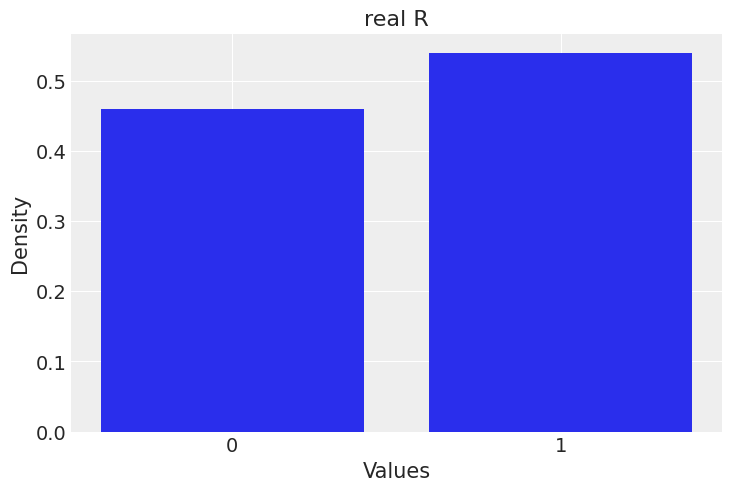

In [ ]:
counts = np.bincount(df['R']) / len(df['R'])

plt.bar([0, 1], counts, tick_label=['0', '1'])
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('real R')
plt.show()

Our samples look good enough to start.

In [ ]:
with pm.Model() as m_B2:
    alpha = pm.Normal("alpha", -0.5, 0.1, shape = 18, dims='participant')
    beta = pm.Normal('beta', 0.5, 0.1, shape = [3, 3], dims=['PB', 'A'])
    p = pm.math.invlogit(beta[df["PB"], df["A"]] + alpha[df['participant']])
    R = pm.Binomial('R', p = p, n = 1, observed = df["R"])
    trace_B2 = pm.sample(idata_kwargs = {'log_likelihood': True})

In [ ]:
az.summary(trace_B2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[0],-0.828,0.079,-0.983,-0.684,0.001,0.001,4813.0,1460.0,1.00
alpha[1],-0.357,0.080,-0.520,-0.219,0.001,0.001,4560.0,1363.0,1.00
alpha[2],-0.239,0.081,-0.386,-0.085,0.001,0.001,5589.0,1497.0,1.00
alpha[3],-0.416,0.078,-0.573,-0.278,0.001,0.001,5123.0,1285.0,1.00
alpha[4],-0.367,0.079,-0.523,-0.225,0.001,0.001,5077.0,1340.0,1.00
alpha[5],-0.173,0.082,-0.317,-0.019,0.001,0.001,5535.0,1489.0,1.00
alpha[6],-0.564,0.081,-0.713,-0.409,0.001,0.001,4279.0,1243.0,1.00
alpha[7],-0.767,0.080,-0.915,-0.622,0.001,0.001,6130.0,1521.0,1.00
alpha[8],-0.582,0.072,-0.717,-0.445,0.001,0.001,4231.0,1457.0,1.00
alpha[9],-0.433,0.079,-0.580,-0.283,0.001,0.001,4843.0,1328.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (27), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0'}>,
        <Axes: title={'center': 'alpha\n0'}>],
       [<Axes: title={'center': 'alpha\n1'}>,
        <Axes: title={'center': 'alpha\n1'}>],
       [<Axes: title={'center': 'alpha\n2'}>,
        <Axes: title={'center': 'alpha\n2'}>],
       [<Axes: title={'center': 'alpha\n3'}>,
        <Axes: title={'center': 'alpha\n3'}>],
       [<Axes: title={'center': 'alpha\n4'}>,
        <Axes: title={'center': 'alpha\n4'}>],
       [<Axes: title={'center': 'alpha\n5'}>,
        <Axes: title={'center': 'alpha\n5'}>],
       [<Axes: title={'center': 'alpha\n6'}>,
        <Axes: title={'center': 'alpha\n6'}>],
       [<Axes: title={'center': 'alpha\n7'}>,
        <Axes: title={'center': 'alpha\n7'}>],
       [<Axes: title={'center': 'alpha\n8'}>,
        <Axes: title={'center': 'alpha\n8'}>],
       [<Axes: title={'center': 'alpha\n9'}>,
        <Axes: title={'center': 'alpha\n9'}>],
       [<Axes: title={'center': 'alpha\n10'}>,
        <Axes: title={'

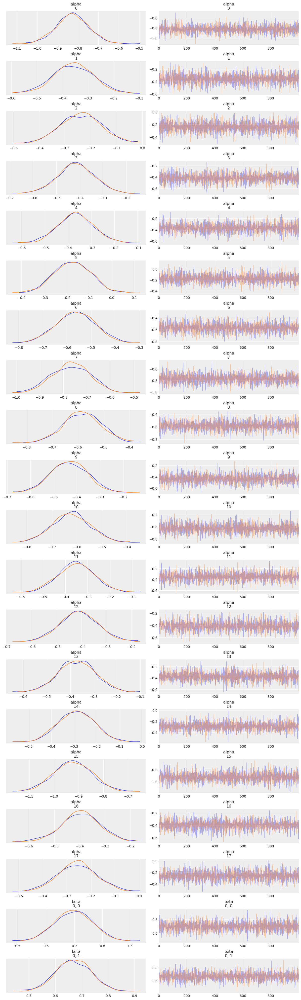

In [ ]:
az.plot_trace(trace_B2, compact=False)

r_hat values are all extremely close to 1.00 and the efficient sample size taken seems very good in the model. We can conclude that the sampling doesn't have any big problem here.

The trace plots also have a pretty random shape without any patterns which further shows our model has converged.

To analyze the values of posteriors it is better to enter the probability space:

In [ ]:
inv_logit(az.summary(trace_B2)["mean"])

alpha[0]      0.264249
alpha[1]      0.485504
alpha[2]      0.546366
alpha[3]      0.453881
alpha[4]      0.478763
alpha[5]      0.582246
alpha[6]      0.381072
alpha[7]      0.288845
alpha[8]      0.373320
alpha[9]      0.444974
alpha[10]     0.351831
alpha[11]     0.488252
alpha[12]     0.457602
alpha[13]     0.475520
alpha[14]     0.519240
alpha[15]     0.225832
alpha[16]     0.463565
alpha[17]     0.536435
beta[0, 0]    0.655431
beta[0, 1]    0.647941
beta[0, 2]    0.627849
beta[1, 0]    0.600608
beta[1, 1]    0.632045
beta[1, 2]    0.609926
beta[2, 0]    0.603962
beta[2, 1]    0.619635
beta[2, 2]    0.629017
Name: mean, dtype: float64

Again, our betasare pretty close, and based on the summary table we can see they intersect each other for a large portion. And by comparing the inverse logit alpha values, we can see that the participants with the lowest bernoulli probability are participators 16 and 1. Thus, they have the lowest change of getting cash in each trial. Which is the same result we had in our previous model.

In [ ]:
B2_wais = az.compare(
    {'m_B2': trace_B2, 'trace_B2_again': trace_B2},
    scale="deviance",
    ic="waic"
)
B1_wais = az.compare(
    {'m_B1': trace_B1, 'trace_B1_again': trace_B1},
    scale="deviance",
    ic="waic"
)
compare_models = pd.concat([B1_wais, B2_wais]).iloc[[0, 2], :]
compare_models

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
m_B1,0,859.856015,28.422835,0.0,0.5,30.348528,0.0,True,deviance
m_B2,0,6518.378305,11.779798,0.0,0.5,16.053829,0.0,False,deviance


This method of comparison tells us about the predictive performance of different models (not causality, because predictive performance and causal inference are not necessarily aligned. Here, It could be seen that model m_B1 has a much lower elpd_waic which means this model has a better predictive performance compared with m_B2.

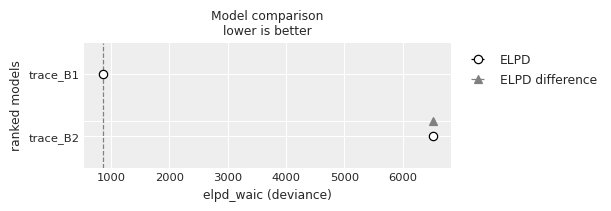

In [ ]:
az.plot_compare(compare_models)
plt.show()

### Part 3

Here, I create a Bernouilli regression model for decisions. Assume $D \sim \text{Bernoulli}(p)$ where $D$ is the decision at each instance where a participant decides to either pump or cash-in, and $p$ is the probability of cash-in. First, I assume a similar DAG for decisions, and estimate actor and treatment effects similarly.

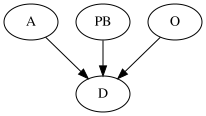

In [ ]:
dot = Digraph()

# experimental
dot.node("A", "A") # alcohol condition
dot.node("PB", "PB") # probability of burst
dot.node("O", "O") # opportunity

# outcomes
dot.node("D", "D")

# edges
dot.edge("A", "D")
dot.edge("PB", "D")
dot.edge("O", "D")
dot

$$
\begin{align*}
  D &\sim \text{Bernoulli}(p)
\\
  logit(p_i) &=  \alpha_{participant[i]} + \beta_{obs:A[i]} * \eta_{A[i], PB[i]}
\\
  \beta_{obs:[k]} &\sim \text{Normal}(0, 0.1)
\\
  \alpha_j &\sim \text{Normal}(-0.5, 0.1)
\\
 \eta_{k,l} &\sim \text{Normal}(0.5, 0.1)
\\
\end{align*}
$$

In [ ]:
df['D'] = df.apply(lambda row: [0] * (row['pumps'] - 1) + [1] if row['cash'] != 0 else [0] * row['pumps'], axis=1)
df3 = df.explode('D').reset_index()
df3

,index,participant,condition,p_burst,trial,pumps,cash,total,session,block,explosion,R,PB,A,D
0,0,0,drunk,15,1,12,0.00,0.00,1,1,True,0,1,0,0
1,0,0,drunk,15,1,12,0.00,0.00,1,1,True,0,1,0,0
2,0,0,drunk,15,1,12,0.00,0.00,1,1,True,0,1,0,0
3,0,0,drunk,15,1,12,0.00,0.00,1,1,True,0,1,0,0
4,0,0,drunk,15,1,12,0.00,0.00,1,1,True,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19311,4857,17,tipsy,20,28,2,0.63,12.83,3,3,False,1,2,1,1
19312,4858,17,tipsy,20,29,2,0.63,13.46,3,3,False,1,2,1,0
19313,4858,17,tipsy,20,29,2,0.63,13.46,3,3,False,1,2,1,1
19314,4859,17,tipsy,20,30,2,0.63,14.09,3,3,False,1,2,1,0


In [ ]:
with pm.Model() as m_B3:
    alpha_p = pm.Normal("alpha_p", 0.4, 0.1, shape = 18, dims='participant')
    eta_PB_A = pm.Normal('eta_PB_A', 0.6, 0.04, shape = [3, 3], dims=['PB', 'A'])
    beta_O = pm.Normal('beta_O', -3, 0.5, shape = 3, dims=['A'])
    p = pm.math.invlogit(beta_O[ df3["A"]] * eta_PB_A[df3["PB"], df3["A"]] + alpha_p[df3['participant']])
    D = pm.Binomial('D', p = p, n = 1, observed = df3["D"])
    idata3 = pm.sample_prior_predictive(samples=50)

In [ ]:
PB = np.random.choice([0, 1, 2], size = N)
A = np.random.choice([0, 1, 2], size = N)

x = np.array([1, 0])
samples = len(idata.prior.draw)
inv_logits2 = []
for i in [0, 1, 2]:
  for j in [0, 1, 2]:
    for k in range(18):
      alphas = idata3.prior.alpha_p[:, :, k].values
      etas = idata3.prior.eta_PB_A[:, :, i, j].values
      betas = idata3.prior.beta_O[:, :, j].values

      inv_logits2.append(inv_logit((alphas+betas * etas).mean()))


In [ ]:

x = np.array([0, 1, 2])
x_labels = ['0.10', '0.15', '0.2']

x2 = np.array([0, 1, 2])
x2_labels = ['drunk', 'tipsy', 'sober']

samples = len(idata.prior.draw)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):

            alphas = idata3.prior.alpha_p[:, :, k].values
            etas = idata3.prior.eta_PB_A[:, :, i, j].values
            betas = idata3.prior.beta_O[:, :, j].values
            ax1.scatter(label2, inv_logit((alphas.mean()+betas*etas.mean())), color='k', alpha=0.3)

for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):
            alphas = idata3.prior.alpha_p[:, :, k].values
            etas = idata3.prior.eta_PB_A[:, :, i, j].values
            betas = idata3.prior.beta_O[:, :, j].values
            ax2.scatter(label, inv_logit((alphas.mean()+betas.mean()*etas)), color='k', alpha=0.3)

for sample in range(samples):
  for j, label2 in zip(x2, x2_labels):
      for i, label in zip(x, x_labels):
        for l in range(18):
            alphas = idata3.prior.alpha_p[:, :, k].values
            etas = idata3.prior.eta_PB_A[:, :, i, j].values
            betas = idata3.prior.beta_O[:, :, j].values
            ax2.scatter(label, inv_logit((alphas+betas.mean()*etas.mean())), color='k', alpha=0.3)
'''

In [ ]:
D = np.random.binomial(n = 1, p = inv_logits2)

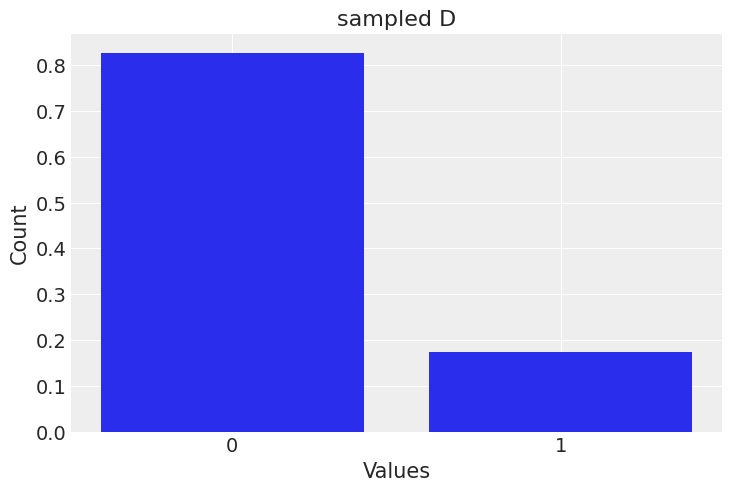

In [ ]:
counts = np.bincount(D) / len(D)

plt.bar([0, 1], counts, tick_label=['0', '1'])
plt.xlabel('Values')
plt.ylabel('Count')
plt.title('sampled D')
plt.show()

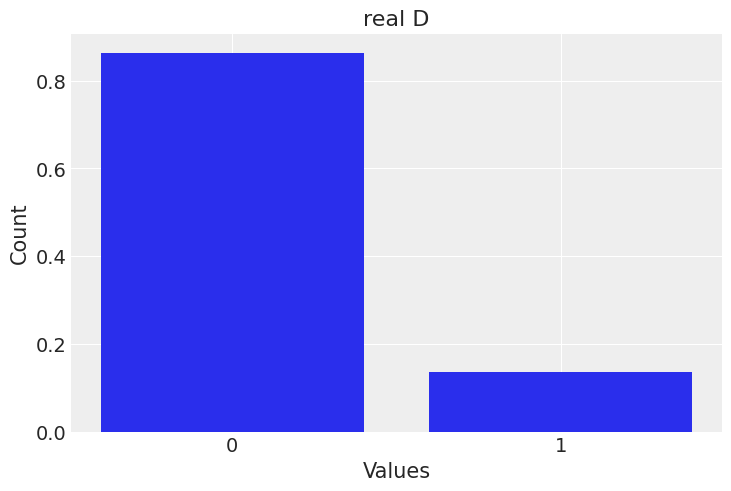

In [ ]:
counts = np.bincount(df3['D']) / len(df3['D'])

plt.bar([0, 1], counts, tick_label=['0', '1'])
plt.xlabel('Values')
plt.ylabel('Count')
plt.title('real D')
plt.show()

In [ ]:
with pm.Model() as m_B3:
    alpha_p = pm.Normal("alpha_p", 0.4, 0.1, shape = 18, dims='participant')
    eta_PB_A = pm.Normal('eta_PB_A', 0.6, 0.04, shape = [3, 3], dims=['PB', 'A'])
    beta_O = pm.Normal('beta_O', -3, 0.5, shape = 3, dims=['A'])
    p = pm.math.invlogit(beta_O[ df3["A"]] * eta_PB_A[df3["PB"], df3["A"]] + alpha_p[df3['participant']])
    D = pm.Binomial('D', p = p, n = 1, observed = df3["D"])
    trace_B3 = pm.sample()

/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (30), generating only 20 plots
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


array([[<Axes: title={'center': 'alpha_p\n0'}>,
        <Axes: title={'center': 'alpha_p\n0'}>],
       [<Axes: title={'center': 'alpha_p\n1'}>,
        <Axes: title={'center': 'alpha_p\n1'}>],
       [<Axes: title={'center': 'alpha_p\n2'}>,
        <Axes: title={'center': 'alpha_p\n2'}>],
       [<Axes: title={'center': 'alpha_p\n3'}>,
        <Axes: title={'center': 'alpha_p\n3'}>],
       [<Axes: title={'center': 'alpha_p\n4'}>,
        <Axes: title={'center': 'alpha_p\n4'}>],
       [<Axes: title={'center': 'alpha_p\n5'}>,
        <Axes: title={'center': 'alpha_p\n5'}>],
       [<Axes: title={'center': 'alpha_p\n6'}>,
        <Axes: title={'center': 'alpha_p\n6'}>],
       [<Axes: title={'center': 'alpha_p\n7'}>,
        <Axes: title={'center': 'alpha_p\n7'}>],
       [<Axes: title={'center': 'alpha_p\n8'}>,
        <Axes: title={'center': 'alpha_p\n8'}>],
       [<Axes: title={'center': 'alpha_p\n9'}>,
        <Axes: title={'center': 'alpha_p\n9'}>],
       [<Axes: title={'center'

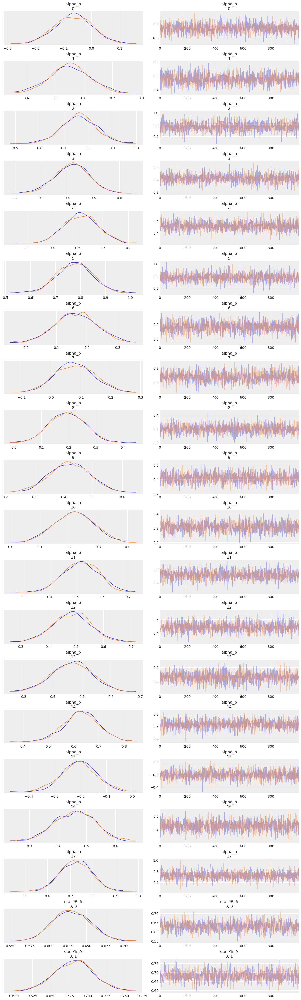

In [ ]:
az.plot_trace(trace_B3, compact=False)

r_hat values are all extremely close to 1.00 and the efficient sample size taken seems very good in the model. We can conclude that the sampling doesn't have any big problem here.

The trace plots also have a pretty random shape without any patterns which further shows our model has converged.

To analyze the values of posteriors it is better to enter the probability space:

In [ ]:
az.summary(trace_B3)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha_p[0],-0.064,0.067,-0.192,0.063,0.001,0.001,2411.0,1762.0,1.00
alpha_p[1],0.552,0.071,0.417,0.685,0.002,0.001,2169.0,1326.0,1.01
alpha_p[2],0.763,0.072,0.629,0.905,0.001,0.001,2358.0,1231.0,1.00
alpha_p[3],0.420,0.066,0.295,0.543,0.001,0.001,2586.0,1042.0,1.01
alpha_p[4],0.513,0.068,0.400,0.651,0.001,0.001,2543.0,1415.0,1.00
alpha_p[5],0.778,0.071,0.652,0.911,0.001,0.001,2810.0,1241.0,1.00
alpha_p[6],0.163,0.068,0.035,0.292,0.001,0.001,2312.0,1372.0,1.00
alpha_p[7],0.079,0.067,-0.038,0.213,0.001,0.001,2605.0,1683.0,1.00
alpha_p[8],0.196,0.065,0.074,0.314,0.001,0.001,2477.0,1458.0,1.00
alpha_p[9],0.420,0.068,0.300,0.553,0.001,0.001,2343.0,1483.0,1.00


First of all, we note that eta values that show the move of PB x A all seem pretty close to each other for each A index (the first index is PB and the 2nd one is A). So now we can compare them using the beta_o that proc=vides us information about the opportunities:

beta_O values shows us that when participants are in drunk condition, we can excpect the values of their logic to decrease by a larger value compared to when the participants are sober. This could also be observed in the following probablity inverted values that the lowest probability belongs to the condition drunk and the highest belongs to the sober. Athough, because of the very close values og beta_O for drunk and tispy, we can't really find much of a significant difference between them.

Also, by observing the eta values, we can see that their values for each PB seems to be extremely close, showing the fact that as PB changes, there does not seem to be much of a change in the logit.

So we can say that opportunity does seem to have some effects here. Specially for the difference in the drunk, tipsy, and sober condition. Participants seem to act different in different opportunities.

In addition, in the bellow table of inverse logits we can observe that the lowest cash-in probabiity belong to participants 16 and 1, just similar to our last 2 models. The highest cash-in probability also belongs to participants 3 and 18.


Now we analyze the

In [ ]:
inv_logit(az.summary(trace_B3)["mean"])

alpha_p[0]        0.484005
alpha_p[1]        0.634599
alpha_p[2]        0.682005
alpha_p[3]        0.603483
alpha_p[4]        0.625509
alpha_p[5]        0.685249
alpha_p[6]        0.540660
alpha_p[7]        0.519740
alpha_p[8]        0.548844
alpha_p[9]        0.603483
alpha_p[10]       0.554285
alpha_p[11]       0.627148
alpha_p[12]       0.619164
alpha_p[13]       0.614437
alpha_p[14]       0.652943
alpha_p[15]       0.448929
alpha_p[16]       0.612777
alpha_p[17]       0.673487
eta_PB_A[0, 0]    0.652489
eta_PB_A[0, 1]    0.664185
eta_PB_A[0, 2]    0.657911
eta_PB_A[1, 0]    0.652489
eta_PB_A[1, 1]    0.645656
eta_PB_A[1, 2]    0.648625
eta_PB_A[2, 0]    0.638071
eta_PB_A[2, 1]    0.628316
eta_PB_A[2, 2]    0.632975
beta_O[0]         0.024364
beta_O[1]         0.024892
beta_O[2]         0.028059
Name: mean, dtype: float64

# References

McElreath, R. (2020). Statistical Rethinking: A Bayesian Course with Examples in R and STAN.